## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import linear_model

%matplotlib inline 
from matplotlib.ticker import FuncFormatter
import matplotlib.style as style

import seaborn as sns

# Set today's date
import datetime as dt
today = dt.datetime.today().strftime("%Y.%m.%d")

Duplicate key in file '/Users/iamgoddey/.matplotlib/matplotlibrc' line #2.

Bad key "backbend" on line 2 in
/Users/iamgoddey/.matplotlib/matplotlibrc.
You probably need to get an updated matplotlibrc file from
http://github.com/matplotlib/matplotlib/blob/master/matplotlibrc.template
or from the matplotlib source distribution


## Loading the Data

In [2]:
Train = pd.read_csv('Train.csv')
Test = pd.read_csv('Test.csv')
Riders = pd.read_csv('Riders.csv')
Train.head(2)

,Order No,User Id,Vehicle Type,Platform Type,Personal or Business,Placement - Day of Month,Placement - Weekday (Mo = 1),Placement - Time,Confirmation - Day of Month,Confirmation - Weekday (Mo = 1),...,Arrival at Destination - Time,Distance (KM),Temperature,Precipitation in millimeters,Pickup Lat,Pickup Long,Destination Lat,Destination Long,Rider Id,Time from Pickup to Arrival
0,Order_No_4211,User_Id_633,Bike,3,Business,9,5,9:35:46 AM,9,5,...,10:39:55 AM,4,20.4,NaN,-1.317755,36.830370,-1.300406,36.829741,Rider_Id_432,745
1,Order_No_25375,User_Id_2285,Bike,3,Personal,12,5,11:16:16 AM,12,5,...,12:17:22 PM,16,26.4,NaN,-1.351453,36.899315,-1.295004,36.814358,Rider_Id_856,1993


In [3]:
Test.head(2)

,Order No,User Id,Vehicle Type,Platform Type,Personal or Business,Placement - Day of Month,Placement - Weekday (Mo = 1),Placement - Time,Confirmation - Day of Month,Confirmation - Weekday (Mo = 1),...,Pickup - Weekday (Mo = 1),Pickup - Time,Distance (KM),Temperature,Precipitation in millimeters,Pickup Lat,Pickup Long,Destination Lat,Destination Long,Rider Id
0,Order_No_19248,User_Id_3355,Bike,3,Business,27,3,4:44:10 PM,27,3,...,3,5:06:47 PM,8,NaN,NaN,-1.333275,36.870815,-1.305249,36.822390,Rider_Id_192
1,Order_No_12736,User_Id_3647,Bike,3,Business,17,5,12:57:35 PM,17,5,...,5,1:25:37 PM,5,NaN,NaN,-1.272639,36.794723,-1.277007,36.823907,Rider_Id_868


* ".head()" returns first five observations of the dataset. Unless specified.

In [254]:
#variable definitions

variables = pd.read_csv('VariableDefinitions.csv')

variables

,Order No,Unique number identifying the order
0,User Id,Unique number identifying the customer on a pl...
1,Vehicle Type,"For this competition limited to bikes, however..."
2,Platform Type,"Platform used to place the order, there are 4 ..."
3,Personal or Business,Customer type
4,Placement - Day of Month,Placement - Day of Month i.e 1-31
5,Placement - Weekday (Mo = 1),Placement - Weekday (Monday = 1)
6,Placement - Time,Placement - Time - Time of day the order was p...
7,Confirmation - Day of Month,Confirmation - Day of Month i.e 1-31
8,Confirmation - Weekday (Mo = 1),Confirmation - Weekday (Monday = 1)
9,Confirmation - Time,Confirmation - Time - Time of day the order wa...


In [4]:
Combine_Train_Riders = pd.merge(Train, Riders)
Combine_Test_Riders = pd.merge(Test,Riders)

# EDA
* Preparing a comprehensive exploratory data analysis (EDA) using the merged training dataset.

In [5]:
import pandas_profiling

In [6]:
Data_Prof_Train_Riders = Combine_Train_Riders.profile_report(title='Pandas Profiling Report', plot={'histogram': {'bins': 8}})
rejectvar_Train_Riders = Data_Prof_Train_Riders.get_rejected_variables(threshold=0.9)
Data_Prof_Train_Riders

In [7]:
Data_Prof_Test_Riders = Combine_Test_Riders.profile_report(title='Pandas Profiling Report', plot={'histogram': {'bins': 8}})
rejecvar_Test_Riders = Data_Prof_Test_Riders.get_rejected_variables(threshold=0.9)
Data_Prof_Test_Riders

## Data Insights
* The Summary of a DataFrame helps to understand the type of variable, data type and presence of null values.

In [8]:
# The size of Data set
print('The size of the Train_Riders data is :', Combine_Train_Riders.size)
print('The size of the Test_Riders data is :', Combine_Test_Riders.size)


# Show dimension of the merged data
print("Dimension: {}".format(Combine_Train_Riders.shape))
print("Dimension: {}".format(Combine_Test_Riders.shape))

The size of the Train_Riders data is : 699633
The size of the Test_Riders data is : 204972
Dimension: (21201, 33)
Dimension: (7068, 29)


* The size of Train_Rider data is 699633 which is made up of the number of rows times the number of columns if DataFrame.
* The size of Test_Rider data is 204972 which is made up of the number of rows times the number of columns if DataFrame.
* The Train_Riders dataset comprises of 21201 observations and 33 features,
* out of which one is dependent variable (Target - Time from Pickup to Arrival) and the remaining 32 are independent variables.
* The Test_Riders dataset comprises of 7068 observations and 29 features,
* out of which there is no dependent variable (Target - Time from Pickup to Arrival) and all 29 features are considered to independent variables.

In [9]:
print(Combine_Train_Riders.columns.values),
Combine_Test_Riders.columns.values,

['Order_No' 'User_Id' 'Vehicle_Type' 'Platform_Type'
 'Personal_or_Business' 'Placement_-_Day_of_Month'
 'Placement_-_Weekday_(Mo_=_1)' 'Placement_-_Time'
 'Confirmation_-_Day_of_Month' 'Confirmation_-_Weekday_(Mo_=_1)'
 'Confirmation_-_Time' 'Arrival_at_Pickup_-_Day_of_Month'
 'Arrival_at_Pickup_-_Weekday_(Mo_=_1)' 'Arrival_at_Pickup_-_Time'
 'Pickup_-_Day_of_Month' 'Pickup_-_Weekday_(Mo_=_1)' 'Pickup_-_Time'
 'Arrival_at_Destination_-_Day_of_Month'
 'Arrival_at_Destination_-_Weekday_(Mo_=_1)'
 'Arrival_at_Destination_-_Time' 'Distance_(KM)' 'Temperature'
 'Precipitation_in_millimeters' 'Pickup_Lat' 'Pickup_Long'
 'Destination_Lat' 'Destination_Long' 'Rider_Id'
 'Time_from_Pickup_to_Arrival' 'No_Of_Orders' 'Age' 'Average_Rating'
 'No_of_Ratings']


(array(['Order_No', 'User_Id', 'Vehicle_Type', 'Platform_Type',
        'Personal_or_Business', 'Placement_-_Day_of_Month',
        'Placement_-_Weekday_(Mo_=_1)', 'Placement_-_Time',
        'Confirmation_-_Day_of_Month', 'Confirmation_-_Weekday_(Mo_=_1)',
        'Confirmation_-_Time', 'Arrival_at_Pickup_-_Day_of_Month',
        'Arrival_at_Pickup_-_Weekday_(Mo_=_1)', 'Arrival_at_Pickup_-_Time',
        'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)',
        'Pickup_-_Time', 'Distance_(KM)', 'Temperature',
        'Precipitation_in_millimeters', 'Pickup_Lat', 'Pickup_Long',
        'Destination_Lat', 'Destination_Long', 'Rider_Id', 'No_Of_Orders',
        'Age', 'Average_Rating', 'No_of_Ratings'], dtype=object),)

* Label of each Column all Combined dataset

In [10]:
print(Combine_Train_Riders.info())
Combine_Test_Riders.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21201 entries, 0 to 21200
Data columns (total 33 columns):
Order_No                                     21201 non-null object
User_Id                                      21201 non-null object
Vehicle_Type                                 21201 non-null object
Platform_Type                                21201 non-null int64
Personal_or_Business                         21201 non-null object
Placement_-_Day_of_Month                     21201 non-null int64
Placement_-_Weekday_(Mo_=_1)                 21201 non-null int64
Placement_-_Time                             21201 non-null object
Confirmation_-_Day_of_Month                  21201 non-null int64
Confirmation_-_Weekday_(Mo_=_1)              21201 non-null int64
Confirmation_-_Time                          21201 non-null object
Arrival_at_Pickup_-_Day_of_Month             21201 non-null int64
Arrival_at_Pickup_-_Weekday_(Mo_=_1)         21201 non-null int64
Arrival_at_Pickup_-_Time   

* Both Data have float64, object and integer values
* In both dataset, Temperature and Precipitation in millimeters columns have null/missing values

## Summary Statistics

In [11]:
Target_Column = ['Time_from_Pickup_to_Arrival']
Predictors = list(set(list(Combine_Train_Riders.columns))-set(Target_Column))
Stat_Train_Riders = Combine_Train_Riders.describe(include='all')
Stat_Train_Riders = Stat_Train_Riders.transpose()
Stat_Train_Riders.to_csv('Descriptive_Statistics_in_Train_Riders.csv', index=False)

Stat_Test_Riders = Combine_Test_Riders.describe(include='all')
Stat_Test_Riders = Stat_Test_Riders.transpose()
Stat_Test_Riders.to_csv('Descriptive_Statistics_in_Test_Riders.csv', index=False)

In [12]:
Stat_Train_Riders

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Order_No,21201,21201,Order_No_884,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
User_Id,21201,3186,User_Id_393,645,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Vehicle_Type,21201,1,Bike,21201,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Platform_Type,21201,NaN,NaN,NaN,2.75218,0.625178,1,3,3,3,4
Personal_or_Business,21201,2,Business,17384,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Placement_-_Day_of_Month,21201,NaN,NaN,NaN,15.6537,8.79892,1,8,15,23,31
Placement_-_Weekday_(Mo_=_1),21201,NaN,NaN,NaN,3.24008,1.5673,1,2,3,5,7
Placement_-_Time,21201,15686,12:51:03 PM,6,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Confirmation_-_Day_of_Month,21201,NaN,NaN,NaN,15.6538,8.79889,1,8,15,23,31
Confirmation_-_Weekday_(Mo_=_1),21201,NaN,NaN,NaN,3.24022,1.56723,1,2,3,5,7


## Key Observations -

* Mean value is greater than the median value of each column represented by 50%(50th percentile) in row index except for the plaform type which state otherwise.
* Notably, small differnece in 75th percentile and Max values of predictors "Platform type", "Placement-Day of Month", "Placement-Weekday(Mo=1)", "Confirmation-Day of Month" "Confirmation-Weekday(Mo=1)" and all longitude and latitude, but the remaining from predictor "Distance (KM)" through to predictor "No_of Ratings" have large difference in the 75th percentile and Max values 
* Thus, observations 1 and 2 suggests that there are extreme values/Outliers in some part of our Train_Riders dataset.

In [13]:
Stat_Test_Riders

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Order_No,7068,7068,Order_No_15302,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
User_Id,7068,1617,User_Id_393,206,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Vehicle_Type,7068,1,Bike,7068,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Platform_Type,7068,NaN,NaN,NaN,2.75212,0.624,1,3,3,3,4
Personal_or_Business,7068,2,Business,5780,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Placement_-_Day_of_Month,7068,NaN,NaN,NaN,15.6218,8.77665,1,8,15,23,31
Placement_-_Weekday_(Mo_=_1),7068,NaN,NaN,NaN,3.24986,1.58093,1,2,3,5,7
Placement_-_Time,7068,6336,10:16:54 AM,4,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Confirmation_-_Day_of_Month,7068,NaN,NaN,NaN,15.6218,8.77665,1,8,15,23,31
Confirmation_-_Weekday_(Mo_=_1),7068,NaN,NaN,NaN,3.24986,1.58093,1,2,3,5,7


## Key Observations -

* Mean value is greater than the median value of each column represented by 50%tile (50th percentile) in row index except for the "plaform type" which state otherwise.
* Notably, small differnece in 75th percentile and Max values of predictors "Platform type", "Placement-Day of Month", "Placement-Weekday(Mo=1)", "Confirmation-Day of Month" "Confirmation-Weekday(Mo=1)" and all longitude and latitude, but the remaining from predictor "Distance (KM)" through to predictor "No_of Ratings" have large difference in the 75th percentile and Max values 
* Thus, observations 1 and 2 suggests that there are extreme values/Outliers in some part of our Test_Riders dataset. **To confirm this we use Boxplot to show the outliers**

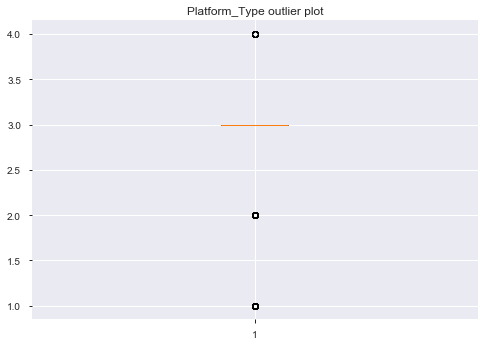

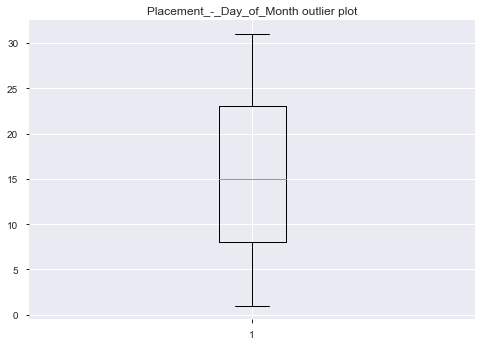

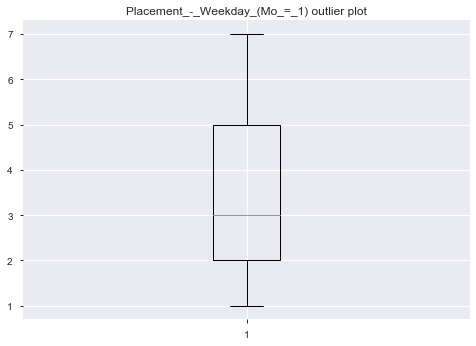

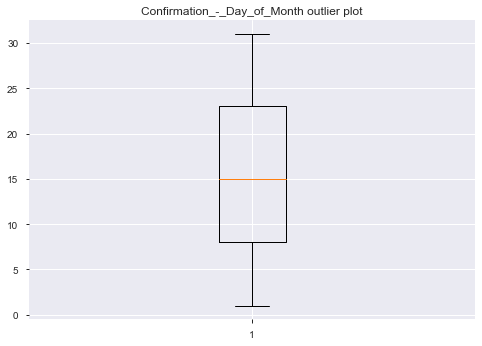

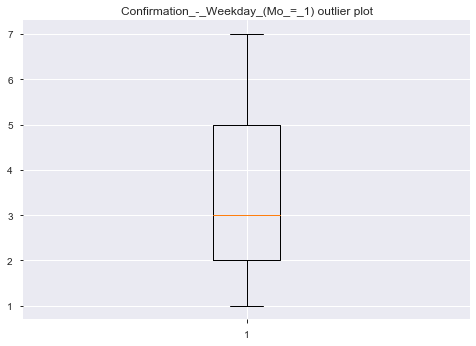

...

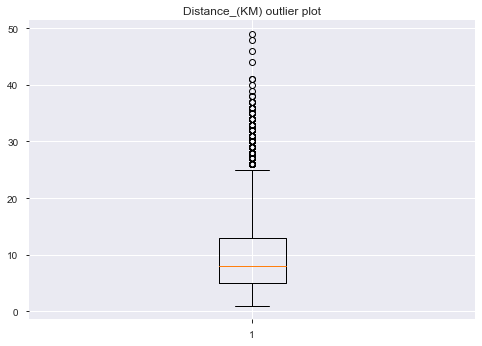

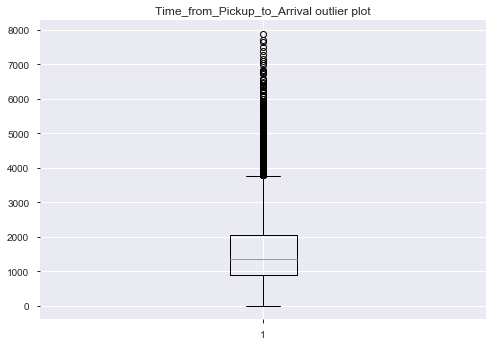

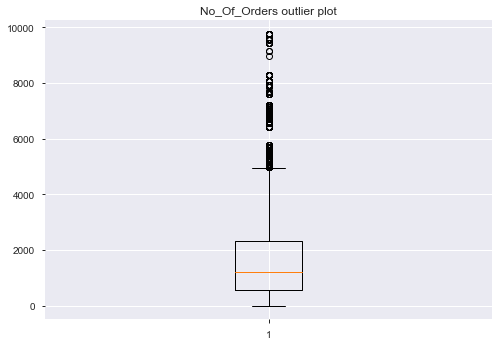

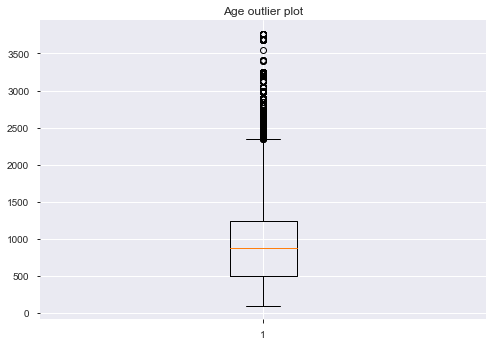

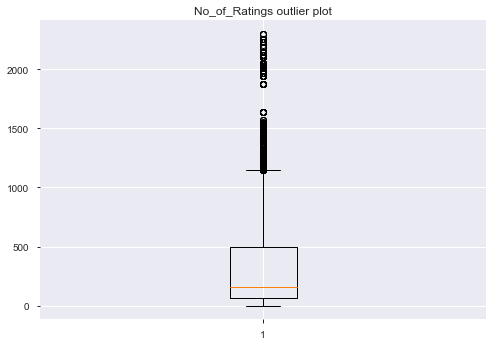

In [14]:
def detect_outlier(data_1):
    
    threshold=1
    mean_1 = np.mean(data_1)
    std_1 =np.std(data_1)
    
    
    for y in data_1:
        z_score= (y - mean_1)/std_1 
        if np.abs(z_score) > threshold:
            outliers.append(y)
           
            
    return outliers

fig=plt.figure()

for i  in range(0,len(Combine_Train_Riders.columns)):
    outliers=[]
   
    if Combine_Train_Riders[Combine_Train_Riders.columns[i]].dtypes== np.int64 or Combine_Train_Riders[Combine_Train_Riders.columns[i]].dtypes== np.int64  :
        
        outliers=detect_outlier(Combine_Train_Riders.iloc[:,i])
        if len(outliers)>0:
                   
            ax = plt.subplot(1,1,1)
            #Variable
            ax.boxplot(Combine_Train_Riders[list(Combine_Train_Riders.columns)[i]])
            plt.title(list(Combine_Train_Riders.columns)[i] + " outlier plot")
            plt.show()

* The features with the Black dots above whisk are all having outliers 

## Understanding the Target Variable

In [15]:
Combine_Train_Riders['Time_from_Pickup_to_Arrival'].unique()

array([ 745, 2886, 2615, ..., 4467, 3153, 4515])

* Target variable/Dependent variable is discrete and numerical in nature.
* "Time from Pickup to Arrival" is the Time in seconds between 'Pickup' and 'Arrival at Destination'.

In [16]:
print('The Maximum seconds from Pickup to Arrival is : ', Combine_Train_Riders['Time_from_Pickup_to_Arrival'].max())
print('The Minimum seconds from Pickup to Arrival is : ', Combine_Train_Riders['Time_from_Pickup_to_Arrival'].min())

The Maximum seconds from Pickup to Arrival is :  7883
The Minimum seconds from Pickup to Arrival is :  1


In [17]:
Combine_Train_Riders['Time_from_Pickup_to_Arrival'].value_counts(sort=True)
#Combine_Train_Riders['Time from Pickup to Arrival'].value_counts(sort=True).tail(200)
#Combine_Train_Riders['Time from Pickup to Arrival'].value_counts(sort=True).head(2000)

2       143
3        97
4        66
5        56
7        37
1        37
6        36
8        29
10       25
1424     24
9        21
1057     20
885      20
1169     19
705      19
1142     19
1046     19
943      19
917      19
1097     19
1093     18
719      18
1058     18
864      18
1393     18
859      18
1207     18
771      17
978      17
1282     17
       ... 
3173      1
3018      1
2794      1
3221      1
4809      1
3237      1
3253      1
3285      1
5350      1
2981      1
4982      1
2661      1
3210      1
3386      1
4742      1
4758      1
3306      1
4790      1
3226      1
4822      1
3194      1
2933      1
3178      1
3146      1
4886      1
2869      1
3050      1
2917      1
4966      1
4154      1
Name: Time_from_Pickup_to_Arrival, Length: 4067, dtype: int64

* This tells us vote count of each Time of arrival in descending order.
* "Time from Pickup to Arrival" has most values concentrated in the categories (in sec) 2, 3, 4 and 5.
* Most of the time from pickup to destination has vote count below 15

## Data Visualisation

## To check missing values

In [18]:
import missingno as mnso

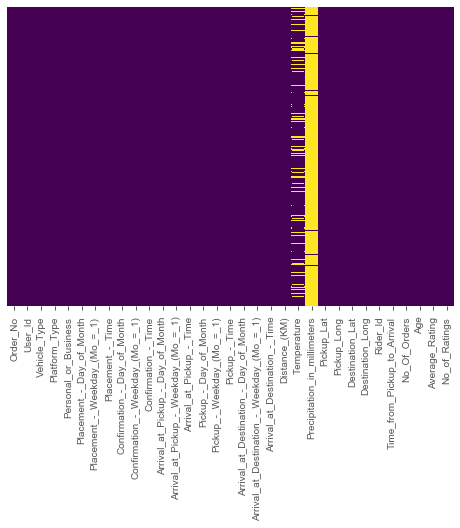

In [19]:
# using heatmap to check for missing values in the Train_Riders dataset
import matplotlib.style as style
style.use('ggplot')
sns.heatmap(Combine_Train_Riders.isnull(),cbar=False,yticklabels=False,cmap = 'viridis')

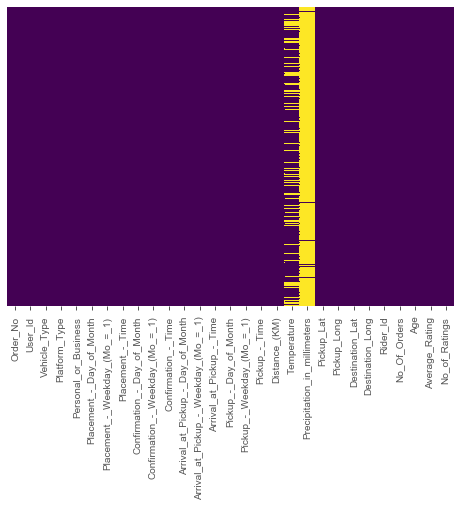

In [20]:
# Using heatmap to check for missing values in the Test_Riders Dataset
import matplotlib.style as style
style.use('ggplot')
sns.heatmap(Combine_Test_Riders.isnull(),cbar=False,yticklabels=False,cmap = 'viridis')

* Both Dataset has missing values. They are Temperature and Precipitation in millimeters Variables
* These are noticed in figure represented by different colour shade on the purple background.
* The missing values in both cases are continuous values (Numeric values).

### Checking the Total number of Missing values in the Datasets

In [21]:
# Total number of missing values in the Train_Riders data 
Missval_Train_Riders = Combine_Train_Riders.isnull().sum()
print('The missing values is show below :', Missval_Train_Riders)

# Total number of missing values in the Test_Riders data 
Missval_Test_Riders = Combine_Test_Riders.isnull().sum()
print('The missing values is show below :', Missval_Test_Riders)


The missing values is show below : Order_No                                         0
User_Id                                          0
Vehicle_Type                                     0
Platform_Type                                    0
Personal_or_Business                             0
Placement_-_Day_of_Month                         0
Placement_-_Weekday_(Mo_=_1)                     0
Placement_-_Time                                 0
Confirmation_-_Day_of_Month                      0
Confirmation_-_Weekday_(Mo_=_1)                  0
Confirmation_-_Time                              0
Arrival_at_Pickup_-_Day_of_Month                 0
Arrival_at_Pickup_-_Weekday_(Mo_=_1)             0
Arrival_at_Pickup_-_Time                         0
Pickup_-_Day_of_Month                            0
Pickup_-_Weekday_(Mo_=_1)                        0
Pickup_-_Time                                    0
Arrival_at_Destination_-_Day_of_Month            0
Arrival_at_Destination_-_Weekday_(Mo_=_1)      

In [22]:
# Summing the missing values in the Train_Riders Data
Summiss_Train_Riders = Combine_Train_Riders.isnull().sum().sum()
print('The Total number of missing values in the Train_Riders is:', Summiss_Train_Riders)

# Summing the missing values in the Test_Riders Data
Summiss_Test_Riders = Combine_Test_Riders.isnull().sum().sum()
print('The Total number of missing values in the Test_Riders is:', Summiss_Test_Riders)

The Total number of missing values in the Train_Riders is: 25015
The Total number of missing values in the Test_Riders is: 8306


In [23]:
# The Percentage of missing values in the Train_Riders dataset
PercentMiss_Train_Riders = Combine_Train_Riders.isna().mean().round(4)*100
print('The percentage of missing values in the dataset is:', PercentMiss_Train_Riders)

# The Percentage of missing values in the Test_Riders dataset
PercentMiss_Test_Riders = Combine_Test_Riders.isna().mean().round(4)*100
print('The percentage of missing values in the dataset is:', PercentMiss_Test_Riders)

The percentage of missing values in the dataset is: Order_No                                      0.00
User_Id                                       0.00
Vehicle_Type                                  0.00
Platform_Type                                 0.00
Personal_or_Business                          0.00
Placement_-_Day_of_Month                      0.00
Placement_-_Weekday_(Mo_=_1)                  0.00
Placement_-_Time                              0.00
Confirmation_-_Day_of_Month                   0.00
Confirmation_-_Weekday_(Mo_=_1)               0.00
Confirmation_-_Time                           0.00
Arrival_at_Pickup_-_Day_of_Month              0.00
Arrival_at_Pickup_-_Weekday_(Mo_=_1)          0.00
Arrival_at_Pickup_-_Time                      0.00
Pickup_-_Day_of_Month                         0.00
Pickup_-_Weekday_(Mo_=_1)                     0.00
Pickup_-_Time                                 0.00
Arrival_at_Destination_-_Day_of_Month         0.00
Arrival_at_Destination_-_Weekd

* The Train_Riders Data has total percent missing cells of $3.6\%$.
* The Test_Riders Data has total percent missing cells of $4.1\%$.

## To Check for Correlation

### Correlation Matrix

In [24]:
CorrMatrix_Train_Riders = Combine_Train_Riders.corr()
CorrMatrix_Train_Riders.head(5)

,Platform_Type,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),Arrival_at_Pickup_-_Day_of_Month,Arrival_at_Pickup_-_Weekday_(Mo_=_1),Pickup_-_Day_of_Month,Pickup_-_Weekday_(Mo_=_1),Arrival_at_Destination_-_Day_of_Month,...,Precipitation_in_millimeters,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,Time_from_Pickup_to_Arrival,No_Of_Orders,Age,Average_Rating,No_of_Ratings
Platform_Type,1.000000,0.012764,-0.058038,0.012770,-0.058005,0.012770,-0.058005,0.012770,-0.058005,0.012770,...,-0.055948,-0.002742,0.021327,0.006319,0.043924,-0.003827,0.024060,-0.074029,-0.014664,-0.031886
Placement_-_Day_of_Month,0.012764,1.000000,0.026148,0.999998,0.026122,0.999998,0.026122,0.999998,0.026122,0.999998,...,-0.204143,-0.004929,-0.005453,0.007541,0.002077,-0.014710,0.008096,-0.000107,0.012790,-0.001709
Placement_-_Weekday_(Mo_=_1),-0.058038,0.026148,1.000000,0.026132,0.999952,0.026132,0.999952,0.026132,0.999952,0.026132,...,-0.050592,-0.000918,0.011008,-0.004299,-0.000875,0.009693,-0.024226,-0.015475,-0.006834,-0.025747
Confirmation_-_Day_of_Month,0.012770,0.999998,0.026132,1.000000,0.026123,1.000000,0.026123,1.000000,0.026123,1.000000,...,-0.204143,-0.004923,-0.005448,0.007550,0.002073,-0.014701,0.008099,-0.000114,0.012796,-0.001712
Confirmation_-_Weekday_(Mo_=_1),-0.058005,0.026122,0.999952,0.026123,1.000000,0.026123,1.000000,0.026123,1.000000,0.026123,...,-0.050592,-0.000883,0.011036,-0.004251,-0.000900,0.009744,-0.024205,-0.015514,-0.006803,-0.025768


In [25]:
CorrMatrix_Test_Riders = Combine_Test_Riders.corr()
CorrMatrix_Test_Riders.head(5)

,Platform_Type,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),Arrival_at_Pickup_-_Day_of_Month,Arrival_at_Pickup_-_Weekday_(Mo_=_1),Pickup_-_Day_of_Month,Pickup_-_Weekday_(Mo_=_1),Distance_(KM),Temperature,Precipitation_in_millimeters,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,No_Of_Orders,Age,Average_Rating,No_of_Ratings
Platform_Type,1.000000,0.017555,-0.060424,0.017555,-0.060424,0.017555,-0.060424,0.017555,-0.060424,0.007366,0.205278,-0.034345,-0.005354,0.015143,0.007290,0.037805,0.027520,-0.070674,-0.022205,-0.037619
Placement_-_Day_of_Month,0.017555,1.000000,0.017254,1.000000,0.017254,1.000000,0.017254,1.000000,0.017254,0.015146,-0.007366,-0.296621,-0.005642,0.019199,-0.007287,0.006075,0.000784,-0.012619,0.008665,-0.001920
Placement_-_Weekday_(Mo_=_1),-0.060424,0.017254,1.000000,0.017254,1.000000,0.017254,1.000000,0.017254,1.000000,0.027008,0.027543,0.030299,0.003722,0.008954,0.023705,-0.001050,-0.027025,-0.018463,-0.007423,-0.023133
Confirmation_-_Day_of_Month,0.017555,1.000000,0.017254,1.000000,0.017254,1.000000,0.017254,1.000000,0.017254,0.015146,-0.007366,-0.296621,-0.005642,0.019199,-0.007287,0.006075,0.000784,-0.012619,0.008665,-0.001920
Confirmation_-_Weekday_(Mo_=_1),-0.060424,0.017254,1.000000,0.017254,1.000000,0.017254,1.000000,0.017254,1.000000,0.027008,0.027543,0.030299,0.003722,0.008954,0.023705,-0.001050,-0.027025,-0.018463,-0.007423,-0.023133


* At a glance, it difficult to see all rows and columns and still pretty hard to understand 
* so we’re going to do some plotting using seaborn heatmap

### Heatmap

Text(0.5, 1, 'Heatmap')

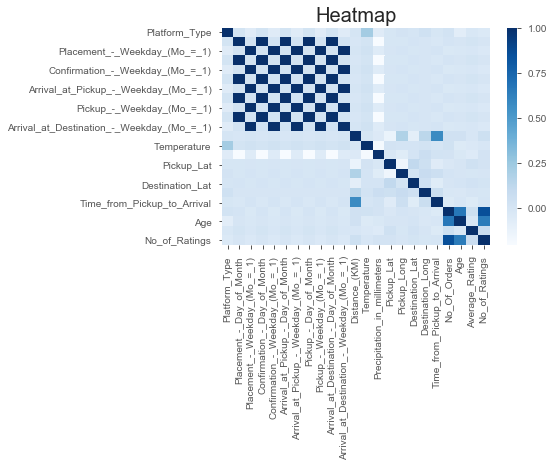

In [26]:
# Heatmap for Depicting the correlation between features in the Train_Riders Data
import matplotlib.style as style
style.use('ggplot')

plt.figure(figsize=(6,4))
sns.heatmap(CorrMatrix_Train_Riders,cmap='Blues',annot=False) 
plt.title('Heatmap', fontsize=20)

Text(0.5, 1, 'Heatmap')

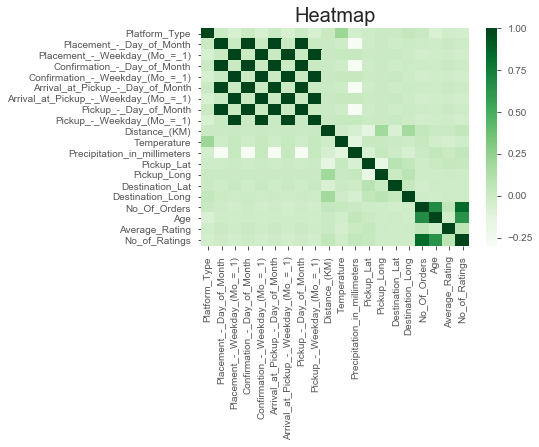

In [27]:
# Heatmap for Depicting the correlation between features in the Test_Riders Data
import matplotlib.style as style
style.use('ggplot')

plt.figure(figsize=(6,4))
sns.heatmap(CorrMatrix_Test_Riders,cmap='Greens',annot=False) 
plt.title('Heatmap', fontsize=20)

* Dark shades in both Datasets represents positive correlation while lighter shades represents negative correlation.
* If we set annot=True, you'll get values by which features are correlated to each other in grid-cells. 
##### The code is implemented below

### Quality correlation matrix

Text(0.5, 1.05, 'Pearson Correlation of Features')

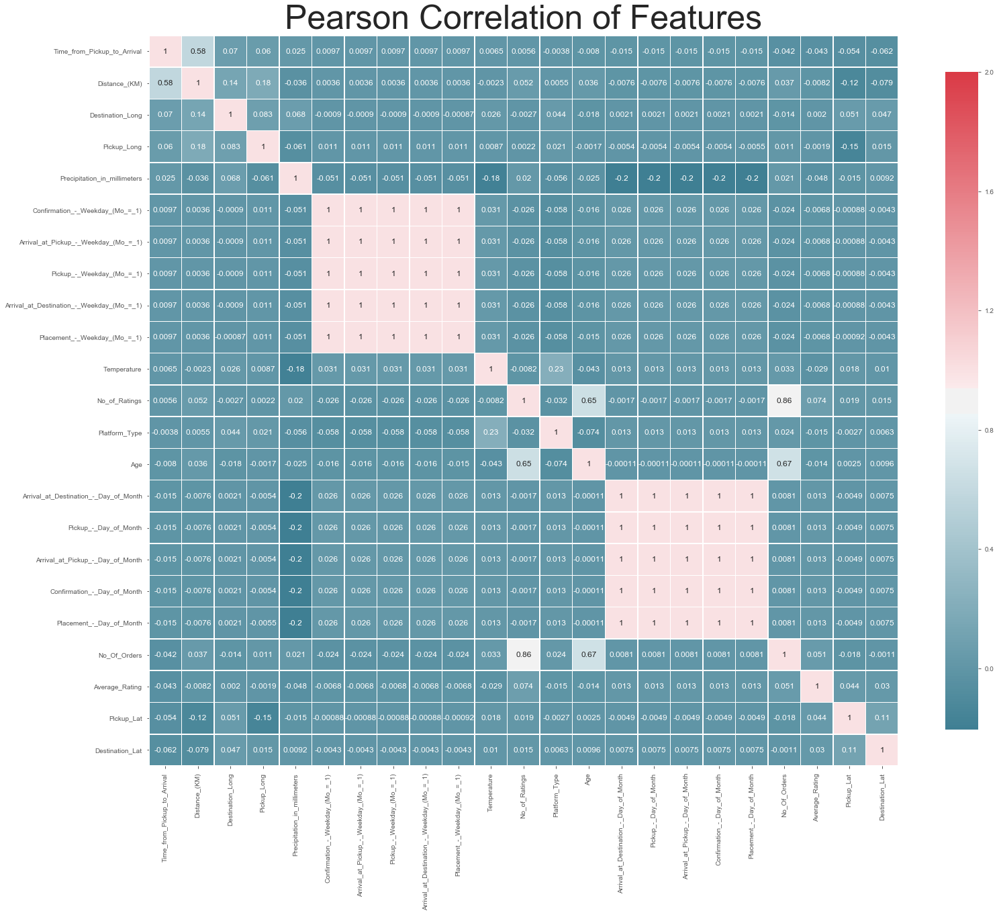

In [28]:
import matplotlib.style as style
style.use('ggplot')

k = 33  #number of variables for heatmap
cols = CorrMatrix_Train_Riders.nlargest(k,'Time_from_Pickup_to_Arrival')['Time_from_Pickup_to_Arrival'].index
cm = Combine_Train_Riders[cols].corr()
colormap = sns.diverging_palette(220, 10, as_cmap = True)
plt.figure(figsize=(25,20))
sns.heatmap(cm, annot=True, cmap = colormap,cbar_kws={'shrink':.9 },
           linewidths=0.5,vmax=2.0, linecolor='white',annot_kws={'fontsize':12 })
plt.title('Pearson Correlation of Features', y=1.05, size=50)

* Here we can infer that all variables with "weekday (Mon=1)" has strong positive correlation with each other, whereas all variables with "Day of Month" also has strong positive correlation with each other.
* "No of Orders" and "No of Ratings" has almost strong positive correlation with each other.
* "Distance (Km)" has almost strong positive correlation with "Time from Pickup to Arrrival".
* "Precipitation in millimeters" has no correlation with the Target variable. We can infer that it has no linear relationship with the target variable
* However it is safe to drop this feature since we want to apply Linear Regression model to the dataset.

## Dealing with Missing Values

In [29]:
Training = Combine_Train_Riders.copy()
Testing = Combine_Test_Riders.copy()

### Filling all NaN=0 in the "Precipitation in millimeters" in both Dataset

In [30]:
# Training
Training['Precipitation_in_millimeters'].fillna(0, inplace = True)
# Testing
Testing['Precipitation_in_millimeters'].fillna(0, inplace = True)

* We filled the rows with null values (Precipitation in millimeters) with zero (0).
* https://weatherspark.com/y/99550/Average-Weather-in-Nairobi-Kenya-Year-Round#Sections-Precipitation
* Not all days it will rain or there will be snow. So we assumed **NaN** to be either it did not rain nor snowed 

### Mean Imputation for Temperature Missing Values in both Dataset

In [31]:
# Training
Training['Temperature'].fillna((Training['Temperature'].mean()), inplace=True)
print(Training.Temperature.head(10))

# Testing
Testing['Temperature'].fillna((Testing['Temperature'].mean()), inplace=True)
print(Testing.Temperature.head(10))

0    20.400000
1    24.500000
2    24.700000
3    15.200000
4    19.200000
5    23.258889
6    15.200000
7    24.500000
8    24.300000
9    27.500000
Name: Temperature, dtype: float64
0    23.24612
1    23.24612
2    19.70000
3    16.40000
4    21.30000
5    20.30000
6    23.00000
7    24.10000
8    23.24612
9    21.50000
Name: Temperature, dtype: float64


* Replace null values of the Temperature with mean on the entire column for numeric columns.
* This is easy to implement and understandable (seems resonable).

## Saving Datasets to .CSV

In [32]:
# Saving the cleaned datasets

Training.to_csv('Train_cleaned.csv')

Testing.to_csv('Test_cleaned.csv')

## To check Outliers

In [33]:
# Training
Numeric_Training = Training._get_numeric_data()

# Testing
Numeric_Testing = Testing._get_numeric_data()
Numeric_Training.head()

,Platform_Type,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),Arrival_at_Pickup_-_Day_of_Month,Arrival_at_Pickup_-_Weekday_(Mo_=_1),Pickup_-_Day_of_Month,Pickup_-_Weekday_(Mo_=_1),Arrival_at_Destination_-_Day_of_Month,...,Precipitation_in_millimeters,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,Time_from_Pickup_to_Arrival,No_Of_Orders,Age,Average_Rating,No_of_Ratings
0,3,9,5,9,5,9,5,9,5,9,...,0.0,-1.317755,36.830370,-1.300406,36.829741,745,1637,1309,13.8,549
1,3,18,5,18,5,18,5,18,5,18,...,0.0,-1.326774,36.787807,-1.356237,36.904295,2886,1637,1309,13.8,549
2,3,31,5,31,5,31,5,31,5,31,...,0.0,-1.255189,36.782203,-1.273412,36.818206,2615,1637,1309,13.8,549
3,3,2,2,2,2,2,2,2,2,2,...,0.0,-1.290315,36.757377,-1.223520,36.802061,2986,1637,1309,13.8,549
4,2,22,2,22,2,22,2,22,2,22,...,0.0,-1.273524,36.799220,-1.300431,36.752427,1602,1637,1309,13.8,549


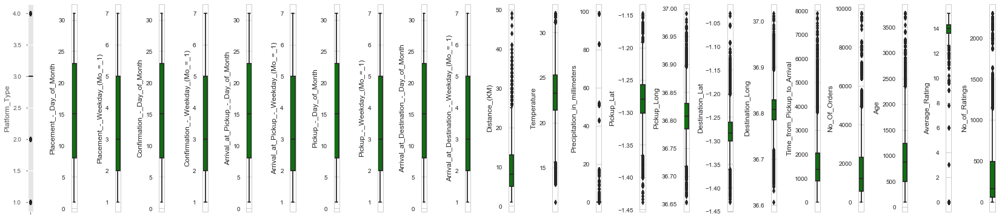

In [34]:
# For Training
l = Numeric_Training.columns.values
number_of_columns = 23
number_of_rows = len(l)-1/number_of_columns
plt.figure(figsize=(number_of_columns,5*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    sns.set_style('whitegrid')
    sns.boxplot(Numeric_Training[l[i]],color='green',orient='v')
    plt.tight_layout()

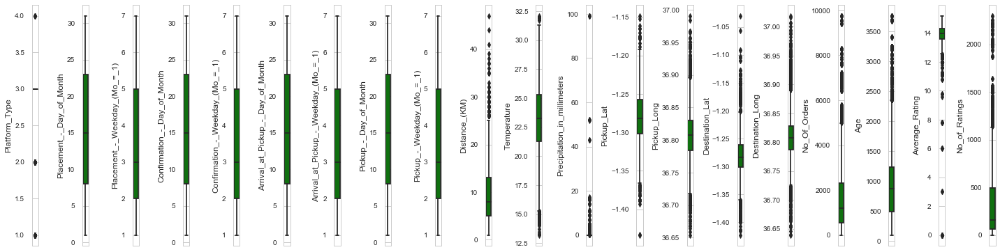

In [35]:
# For Testing
l_2 = Numeric_Testing.columns.values
number_of_columns_Test = 20
number_of_rows_Test = len(l_2)-1/number_of_columns_Test
plt.figure(figsize=(number_of_columns_Test,5*number_of_rows_Test))
for i in range(0,len(l_2)):
    plt.subplot(number_of_rows_Test + 1,number_of_columns_Test,i+1)
    sns.set_style('whitegrid')
    sns.boxplot(Numeric_Testing[l_2[i]],color='green',orient='v')
    plt.tight_layout()

## KDE

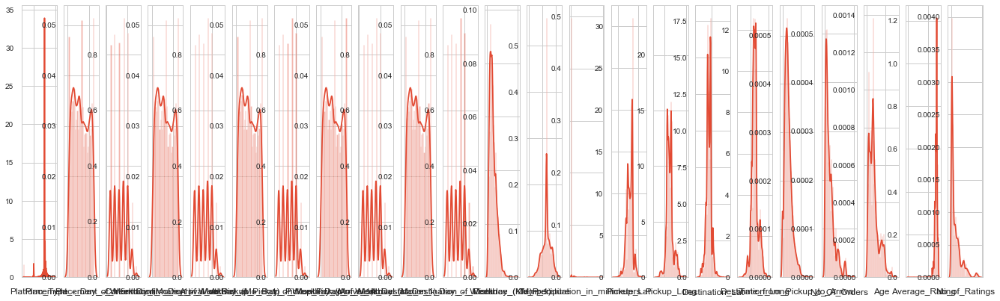

In [36]:
# For Training 
plt.figure(figsize=(number_of_columns,8*number_of_rows))
for i in range(0,len(l)):
    plt.subplot(number_of_rows + 1,number_of_columns,i+1)
    chart=sns.distplot(Numeric_Training[l[i]],kde=True) 
    chart.set_xticklabels(chart.get_xticklabels(), rotation=90, 
                          horizontalalignment='right')
plt.show()

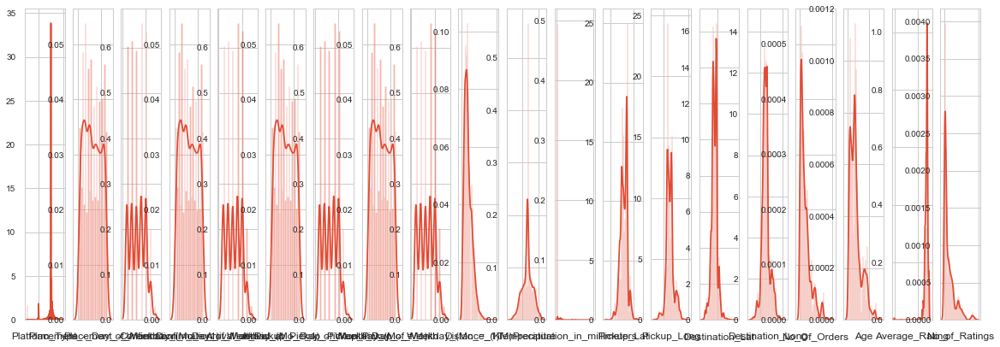

In [37]:
# For Testing
plt.figure(figsize=(number_of_columns_Test,8*number_of_rows_Test))
for i in range(0,len(l_2)):
    plt.subplot(number_of_rows_Test + 1,number_of_columns_Test,i+1)
    chart=sns.distplot(Numeric_Testing[l_2[i]],kde=True) 
    chart.set_xticklabels(chart.get_xticklabels(), rotation=-180, 
                          horizontalalignment='right')
plt.show()

In [38]:
## Univariate Anaysis

# Calculating Skewness in the columns of our Training dataset

#Training.skew().plot.bar(figsize =(10,5))
#plt.show()

In [39]:
# Measuring Kurtosis in our Training dataset

#Training.kurt().plot.bar(figsize =(10,5))
#plt.show()

# FEATURE ENGINEERING

In [40]:
Training_Feature_Eng = Training.copy()
Testing_Feature_Eng  = Testing.copy()

In [41]:
Testing_Feature_Eng.columns

Index(['Order_No', 'User_Id', 'Vehicle_Type', 'Platform_Type',
       'Personal_or_Business', 'Placement_-_Day_of_Month',
       'Placement_-_Weekday_(Mo_=_1)', 'Placement_-_Time',
       'Confirmation_-_Day_of_Month', 'Confirmation_-_Weekday_(Mo_=_1)',
       'Confirmation_-_Time', 'Arrival_at_Pickup_-_Day_of_Month',
       'Arrival_at_Pickup_-_Weekday_(Mo_=_1)', 'Arrival_at_Pickup_-_Time',
       'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)', 'Pickup_-_Time',
       'Distance_(KM)', 'Temperature', 'Precipitation_in_millimeters',
       'Pickup_Lat', 'Pickup_Long', 'Destination_Lat', 'Destination_Long',
       'Rider_Id', 'No_Of_Orders', 'Age', 'Average_Rating', 'No_of_Ratings'],
      dtype='object')

* Make a copy of the Cleaned Training and Testing Data.
* They will be needed for further analysis without the New features which will be created

## New Feature Creating For All Time

In [42]:
# Import datetime Library
from datetime import datetime as dt

### Placement Time of Day

* Creating a new feature (_Placement Time of Day_) for "Placement of Time" by converting it to hours

In [43]:
# converting time in hours from the Training Feature Eng

Training_Feature_Eng['Placement_-_Time'] = Training_Feature_Eng['Placement_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Training_Feature_Eng['Placement Time of Day'] = Training_Feature_Eng['Placement_-_Time'].dt.hour

# converting time in hours from the Training Feature Eng
Testing_Feature_Eng['Placement_-_Time'] = Testing_Feature_Eng['Placement_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Testing_Feature_Eng['Placement Time of Day'] = Testing_Feature_Eng['Placement_-_Time'].dt.hour

In [44]:
Testing_Feature_Eng['Placement Time of Day'].head()

0    16
1    14
2    11
3     9
4    12
Name: Placement Time of Day, dtype: int64

* Now, we extract the hour in which the order was made from the timestamp

In [45]:
print(Training_Feature_Eng['Placement Time of Day'].min())
print(Training_Feature_Eng['Placement Time of Day'].max())

print(Testing_Feature_Eng['Placement Time of Day'].min())
print(Testing_Feature_Eng['Placement Time of Day'].max())

0
22
6
22


* Definition to group hour into Early Morning through to Late Night


In [46]:
def get_part_hr(hour):
    if (hour > 4) and (hour <= 8):
        return 'Early Morning'
    elif (hour > 8) and (hour < 12 ):
        return 'Morning'
    elif (hour >= 12) and (hour <= 16):
        return'Noon'
    elif (hour > 16) and (hour <= 20):
        return 'Evening'
    elif (hour > 20) and (hour <= 22):
        return'Night'
    else:
        return'Late Night'

* We categorize the hour into which time of the day the order was made. 
* Thus either, Early Morning, Morning, Noon, Evening and Late Night

In [47]:
    
# Appending the Categorized get_part_hr onto the Extracted hour from the timdestamp
## Training
Training_Feature_Eng['Placement Time of Day'] = Training_Feature_Eng['Placement Time of Day'].apply(get_part_hr)

## Testing
Testing_Feature_Eng['Placement Time of Day'] = Testing_Feature_Eng['Placement Time of Day'].apply(get_part_hr)

In [48]:
print(Training_Feature_Eng['Placement Time of Day'].head(2))
print(Testing_Feature_Eng['Placement Time of Day'].head(2))

0    Morning
1       Noon
Name: Placement Time of Day, dtype: object
0    Noon
1    Noon
Name: Placement Time of Day, dtype: object


### Confirmation Time of Day

* Creating a new feature (_Confirmation Time of Day_) for "Confirmation of Time" by converting it to hours

In [49]:
# converting time in hours from the Training Feature Eng

Training_Feature_Eng['Confirmation_-_Time'] = Training_Feature_Eng['Confirmation_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Training_Feature_Eng['Confirmation Time of Day'] = Training_Feature_Eng['Confirmation_-_Time'].dt.hour

# converting time in hours from the Training Feature Eng
Testing_Feature_Eng['Confirmation_-_Time'] = Testing_Feature_Eng['Confirmation_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Testing_Feature_Eng['Confirmation Time of Day'] = Testing_Feature_Eng['Confirmation_-_Time'].dt.hour

* We categorize the hour into which time of the day the order was confirmed. 
* Thus either, Early Morning, Morning, Noon, Evening and Late Night

In [50]:
# Storing the Categorized get_part_hr onto the Extracted hour from the timdestamp
## Training
Training_Feature_Eng['Confirmation Time of Day'] = Training_Feature_Eng['Confirmation Time of Day'].apply(get_part_hr)

## Testing
Testing_Feature_Eng['Confirmation Time of Day'] = Testing_Feature_Eng['Confirmation Time of Day'].apply(get_part_hr)

In [51]:
print(Training_Feature_Eng['Confirmation Time of Day'].head(5))
print(Testing_Feature_Eng['Confirmation Time of Day'].head(5))

0          Morning
1             Noon
2             Noon
3    Early Morning
4          Morning
Name: Confirmation Time of Day, dtype: object
0       Noon
1       Noon
2    Morning
3    Morning
4       Noon
Name: Confirmation Time of Day, dtype: object


### Pickup Time of Day

* Creating a new feature (_Pickup Time of Day_) for "Pickup Time" by converting it to Hours

In [52]:
# converting time in hours from the Training Feature Eng

Training_Feature_Eng['Pickup_-_Time'] = Training_Feature_Eng['Pickup_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Training_Feature_Eng['Pickup Time of Day'] = Training_Feature_Eng['Pickup_-_Time'].dt.hour

# converting time in hours from the Training Feature Eng
Testing_Feature_Eng['Pickup_-_Time'] = Testing_Feature_Eng['Pickup_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Testing_Feature_Eng['Pickup Time of Day'] = Testing_Feature_Eng['Pickup_-_Time'].dt.hour

* We categorize the hour into which time of the day the order was picked up. 
* Thus either, Early Morning, Morning, Noon, Evening and Late Night

In [53]:
# Storing the Categorized get_part_hr onto the Extracted hour from the timdestamp
## Training
Training_Feature_Eng['Pickup Time of Day'] = Training_Feature_Eng['Pickup Time of Day'].apply(get_part_hr)

## Testing
Testing_Feature_Eng['Pickup Time of Day'] = Testing_Feature_Eng['Pickup Time of Day'].apply(get_part_hr)

In [54]:
print(Training_Feature_Eng['Pickup Time of Day'].head(5))
print(Testing_Feature_Eng['Pickup Time of Day'].head(5))

0          Morning
1             Noon
2             Noon
3    Early Morning
4          Morning
Name: Pickup Time of Day, dtype: object
0    Evening
1       Noon
2       Noon
3    Morning
4       Noon
Name: Pickup Time of Day, dtype: object


### Arrival at Pickup Time of Day

* Creating a new feature (_Arrivat at Pickup Time of Day_) for "Pickup Time" by converting it to hours

In [55]:
# converting time in hours from the Training Feature Eng

Training_Feature_Eng['Arrival_at_Pickup_-_Time'] = Training_Feature_Eng['Arrival_at_Pickup_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Training_Feature_Eng['Arrival at Pickup Time of Day'] = Training_Feature_Eng['Arrival_at_Pickup_-_Time'].dt.hour

# converting time in hours from the Training Feature Eng
Testing_Feature_Eng['Arrival_at_Pickup_-_Time'] = Testing_Feature_Eng['Arrival_at_Pickup_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Testing_Feature_Eng['Arrival at Pickup Time of Day'] = Testing_Feature_Eng['Arrival_at_Pickup_-_Time'].dt.hour

* We categorize the hour into which time of the day the order arrived for picked up. 
* Thus either, Early Morning, Morning, Noon, Evening and Late Night

In [56]:
# Storing the Categorized get_part_hr onto the Extracted hour from the timdestamp
## Training
Training_Feature_Eng['Arrival at Pickup Time of Day'] = Training_Feature_Eng['Arrival at Pickup Time of Day'].apply(get_part_hr)

## Testing
Testing_Feature_Eng['Arrival at Pickup Time of Day'] = Testing_Feature_Eng['Arrival at Pickup Time of Day'].apply(get_part_hr)

In [57]:
print(Training_Feature_Eng['Arrival at Pickup Time of Day'].head(5))
print(Testing_Feature_Eng['Arrival at Pickup Time of Day'].head(5))

0          Morning
1             Noon
2             Noon
3    Early Morning
4          Morning
Name: Arrival at Pickup Time of Day, dtype: object
0       Noon
1       Noon
2       Noon
3    Morning
4       Noon
Name: Arrival at Pickup Time of Day, dtype: object


## Arrival at Destination

* Creating a new feature (_Arrival at Destionation Time of Day_) for "Arrival at Destination Time" by converting it to hours

In [58]:
# converting time in hours from the Training Feature Eng

Training_Feature_Eng['Arrival_at_Destination_-_Time'] = Training_Feature_Eng['Arrival_at_Destination_-_Time'].apply(lambda x: dt.strptime(x,'%I:%M:%S %p'))
Training_Feature_Eng['Arrival at Destination Time of Day'] = Training_Feature_Eng['Confirmation_-_Time'].dt.hour

# converting time in hours from the Training Feature Eng
Testing_Feature_Eng['Arrival_at_Destination_-_Time'] = Training_Feature_Eng['Arrival_at_Destination_-_Time']
Testing_Feature_Eng['Arrival at Destination Time of Day'] = Training_Feature_Eng['Arrival_at_Destination_-_Time'].dt.hour

In [59]:
Training_Feature_Eng['Arrival at Destination Time of Day'].head()
Testing_Feature_Eng["Arrival at Destination Time of Day"].head()

0    10
1    17
2    14
3     8
4    11
Name: Arrival at Destination Time of Day, dtype: int64

* We categorize the hour into which time of the day the order arrived at the destination. 
* Thus either, Early Morning, Morning, Noon, Evening and Late Night

In [60]:
# Storing the Categorized get_part_hr onto the Extracted hour from the timdestamp
## Training
Training_Feature_Eng['Arrival at Destination Time of Day']= Training_Feature_Eng['Arrival at Destination Time of Day'].apply(get_part_hr)

## Testing
Testing_Feature_Eng['Arrival at Destination Time of Day'] = Testing_Feature_Eng['Arrival at Destination Time of Day'].apply(get_part_hr)

In [61]:
print(Training_Feature_Eng['Arrival at Destination Time of Day'].head(5))
print(Testing_Feature_Eng['Arrival at Destination Time of Day'].head(5))

0          Morning
1             Noon
2             Noon
3    Early Morning
4          Morning
Name: Arrival at Destination Time of Day, dtype: object
0          Morning
1          Evening
2             Noon
3    Early Morning
4          Morning
Name: Arrival at Destination Time of Day, dtype: object


## Creating New Features - Re-Grouping the variable "...Weekday (Mo=1)" into Weekday and Weekend

* Note that, Weekday starts from Monday = 1 through to Friday = 5 and 
* Weekend starts from Saturday = 6 and Sunday = 7

### New Feature = Actual Day of Placement

In [62]:
# For Training
Training_Feature_Eng['Actual Day of Placement'] = np.where(Training_Feature_Eng['Placement_-_Weekday_(Mo_=_1)']< 6,
                                                   'Weekday','Weekend')

# Testing
Testing_Feature_Eng['Actual Day of Placement'] = np.where(Testing_Feature_Eng['Placement_-_Weekday_(Mo_=_1)']< 6,
                                                   'Weekday','Weekend')

In [63]:
print(Training_Feature_Eng['Actual Day of Placement'].head(2))
print(Testing_Feature_Eng['Actual Day of Placement'].head(2))

0    Weekday
1    Weekday
Name: Actual Day of Placement, dtype: object
0    Weekday
1    Weekday
Name: Actual Day of Placement, dtype: object


### New Feature = Actual Day of Confirmation

In [64]:
# Training
Training_Feature_Eng['Actual Day of Confirmation'] = np.where(Training_Feature_Eng['Confirmation_-_Weekday_(Mo_=_1)']< 6,
                                                       'Weekday','Weekend')

# Testing
Testing_Feature_Eng['Actual Day of Confirmation'] = np.where(Testing_Feature_Eng['Confirmation_-_Weekday_(Mo_=_1)']< 6,
                                                       'Weekday','Weekend')

In [65]:
print(Training_Feature_Eng['Actual Day of Confirmation'].tail(2))
print(Testing_Feature_Eng['Actual Day of Confirmation'].tail(2))

21199    Weekday
21200    Weekday
Name: Actual Day of Confirmation, dtype: object
7066    Weekday
7067    Weekend
Name: Actual Day of Confirmation, dtype: object


### New Feature = Actual Day of Pickup

In [66]:
# Training
Training_Feature_Eng['Actual Day of Pickup'] = np.where(Training_Feature_Eng['Pickup_-_Weekday_(Mo_=_1)'] < 6, 
                                       'Weekday', 'Weekend')

# Testing
Testing_Feature_Eng['Actual Day of Pickup'] = np.where(Testing_Feature_Eng['Pickup_-_Weekday_(Mo_=_1)'] < 6, 
                                       'Weekday', 'Weekend')

In [67]:
print(Training_Feature_Eng['Actual Day of Pickup'].head(2))
print(Testing_Feature_Eng['Actual Day of Pickup'].head(2))

0    Weekday
1    Weekday
Name: Actual Day of Pickup, dtype: object
0    Weekday
1    Weekday
Name: Actual Day of Pickup, dtype: object


### New Feature = Actual Day of Arrival at Destination

In [68]:
# Trsining
Training_Feature_Eng['Actual Day of Arrival at Destination'] = np.where(Training_Feature_Eng['Arrival_at_Destination_-_Weekday_(Mo_=_1)'] < 6, 
                                                                 'Weekday', 'Weekend')
# Testing
Testing_Feature_Eng['Arrival_at_Destination_-_Weekday_(Mo_=_1)'] = Training_Feature_Eng['Arrival_at_Destination_-_Weekday_(Mo_=_1)']
Testing_Feature_Eng['Actual Day of Arrival at Destination'] = np.where(Testing_Feature_Eng['Arrival_at_Destination_-_Weekday_(Mo_=_1)'] < 6, 
                                                                 'Weekday', 'Weekend')

In [69]:
print(Training_Feature_Eng['Actual Day of Arrival at Destination'].head(2))
print(Testing_Feature_Eng['Actual Day of Arrival at Destination'].head(2))

0    Weekday
1    Weekday
Name: Actual Day of Arrival at Destination, dtype: object
0    Weekday
1    Weekday
Name: Actual Day of Arrival at Destination, dtype: object


### New Feature = Actual Day of Arrival at Pickup

In [70]:
# Training
Training_Feature_Eng['Actual Day of Arrival at Pickup'] = np.where(Training_Feature_Eng['Arrival_at_Pickup_-_Weekday_(Mo_=_1)'] < 6, 
                                                            'Weekday', 'Weekend')

# Testing
Testing_Feature_Eng['Actual Day of Arrival at Pickup'] = np.where(Testing_Feature_Eng['Arrival_at_Pickup_-_Weekday_(Mo_=_1)'] < 6, 
                                                            'Weekday', 'Weekend')

In [71]:
print(Training_Feature_Eng['Actual Day of Arrival at Pickup'].tail(2))
print(Testing_Feature_Eng['Actual Day of Arrival at Pickup'].tail(2))

21199    Weekday
21200    Weekday
Name: Actual Day of Arrival at Pickup, dtype: object
7066    Weekday
7067    Weekend
Name: Actual Day of Arrival at Pickup, dtype: object


### New Feature = Proximity of Pickup and Destination points
 * using Central Business District (CBD) of Nairobi as Reference

In [72]:
import sys
!{sys.executable} -m pip install geopy

In [73]:
import webbrowser
#webbrowser.open("https://en.wikipedia.org/wiki/Upper_Hill,_Nairobi")

### For Pickup Point

In [74]:
# importing geodesic from geopy 
from geopy.distance import geodesic

# Creating a column for CBD proximity and populating it with Nan in both Data set
Training_Feature_Eng['Proximity to Pickup Point'] = np.nan
Testing_Feature_Eng['Proximity to Pickup Point'] = np.nan

# Latitude and longitude for Central Business District of Nairobi
CBD_Nairobi=(-1.299719, 36.816097)

# Iterating through Data to compute for Distance(km) for both Training and Testing Data
for i, row in Training_Feature_Eng.iterrows():
    Training_Feature_Eng.loc[i, 'Proximity to Pickup Point'] = geodesic((Training_Feature_Eng.loc[i, 'Pickup_Lat'],
                                                                  Training_Feature_Eng.loc[i, 'Pickup_Long']),CBD_Nairobi).km 
for i, row in Testing_Feature_Eng.iterrows():
    Testing_Feature_Eng.loc[i, 'Proximity to Pickup Point'] = geodesic((Testing_Feature_Eng.loc[i, 'Pickup_Lat'],
                                                                  Testing_Feature_Eng.loc[i, 'Pickup_Long']),CBD_Nairobi).km 

In [75]:
print(Training_Feature_Eng['Proximity to Pickup Point'].head(2))
print(Testing_Feature_Eng['Proximity to Pickup Point'].head(2))

0    2.549607
1    4.343066
Name: Proximity to Pickup Point, dtype: float64
0    7.130916
1    6.789472
Name: Proximity to Pickup Point, dtype: float64


### For Destination Point

In [76]:
# importing geodesic from geopy 
from geopy.distance import geodesic

#Creating a column for CBD proximity and populating it with Nan for both dataset
Training_Feature_Eng['Proximity to Destination'] = np.nan
Testing_Feature_Eng['Proximity to Destination'] = np.nan


# Latitude and longitude for Central Business District of Nairobi
CBD_Nairobi=(-1.299719, 36.816097)

# Iterating through Data to compute for Distance (KM) for both Training and Testing Dataset
for i, row in Training_Feature_Eng.iterrows():
    Training_Feature_Eng.loc[i, 'Proximity to Destination'] = geodesic((Training_Feature_Eng.loc[i, 'Destination_Lat'],
                                                                  Training_Feature_Eng.loc[i, 'Destination_Long']),CBD_Nairobi).km
    
for i, row in Testing_Feature_Eng.iterrows():
    Testing_Feature_Eng.loc[i, 'Proximity to Destination'] = geodesic((Testing_Feature_Eng.loc[i, 'Destination_Lat'],
                                                                  Testing_Feature_Eng.loc[i, 'Destination_Long']),CBD_Nairobi).km 

In [77]:
print(Training_Feature_Eng['Proximity to Destination'].head(2))
print(Testing_Feature_Eng['Proximity to Destination'].head(2))

0     1.520355
1    11.636240
Name: Proximity to Destination, dtype: float64
0    0.929731
1    6.292739
Name: Proximity to Destination, dtype: float64


### Creating New Feature = Grouping Temperature into Average High, Average Low and Normal 

* https://weatherspark.com/y/99550/Average-Weather-in-Nairobi-Kenya-Year-Round#Sections-Temperature
* The hottest day of the year is February 26 in Nairobi-Kenya, with an average high of 27°C and low of 15°C. 
* The coldest day of the year is July 14 n Nairobi-Kenya, with an average low of 12°C and high of 22°C. 

In [78]:
Temperature_Deg = []

# Using a for loop to populate the list
for Degree in Training_Feature_Eng['Temperature']:
    if (Degree >= 15) and (Degree <= 27):
        Temperature_Deg.append('Average High Temperature')
    elif (Degree >= 12) and (Degree <= 22 ):
        Temperature_Deg.append('Average Low Temperature')
    else:
        Temperature_Deg.append('Normal Temperature')

Temperature_Deg_1 = []

# Using a for loop to populate the list
for Degree in Testing_Feature_Eng['Temperature']:
    if (Degree >= 15) and (Degree <= 27):
        Temperature_Deg_1.append('Average High Temperature')
    elif (Degree >= 12) and (Degree <= 22 ):
        Temperature_Deg_1.append('Average Low Temperature')
    else:
        Temperature_Deg_1.append('Normal Temperature')


# Storing the data as a column in Training and Testing Data 
Training_Feature_Eng['Temperature Condition'] = Temperature_Deg
Testing_Feature_Eng['Temperature Condition'] = Temperature_Deg_1

In [79]:
print(Training_Feature_Eng['Temperature Condition'].head(2))
print(Testing_Feature_Eng['Temperature Condition'].head(2))

0    Average High Temperature
1    Average High Temperature
Name: Temperature Condition, dtype: object
0    Average High Temperature
1    Average High Temperature
Name: Temperature Condition, dtype: object


### New Feature = Grouping Day of Month into Weeks

## For Placement Day of Month

In [80]:
# Create a list to store the data
Place_Day_Month = []

# Using a for loop to populate the list
for Each_Day in Training_Feature_Eng['Placement_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Place_Day_Month.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Place_Day_Month.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Place_Day_Month.append('3rd Week')
    else:
        Place_Day_Month.append('4th Week')

# Create a list to store the data
Place_Day_Month_1 = []

# Using a for loop to populate the list
for Each_Day in Testing_Feature_Eng['Placement_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Place_Day_Month_1.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Place_Day_Month_1.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Place_Day_Month_1.append('3rd Week')
    else:
        Place_Day_Month_1.append('4th Week')
            
# Storing the data as a column in Testing and Training
Training_Feature_Eng['Placement_Day into Weeks'] = Place_Day_Month
Testing_Feature_Eng['Placement_Day into Weeks'] = Place_Day_Month_1

In [81]:
print(Training_Feature_Eng['Placement_Day into Weeks'].head(2))
print(Testing_Feature_Eng['Placement_Day into Weeks'].head(2))

0    2nd Week
1    3rd Week
Name: Placement_Day into Weeks, dtype: object
0    4th Week
1    4th Week
Name: Placement_Day into Weeks, dtype: object


## For Confirmation Day of Month

In [82]:
# Create a list to store the data
Confirm_Day_Month = []

# Using a for loop to populate the list
for Each_Day in Training_Feature_Eng['Confirmation_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Confirm_Day_Month.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Confirm_Day_Month.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Confirm_Day_Month.append('3rd Week')
    else:
        Confirm_Day_Month.append('4th Week')

# Create a list to store the data
Confirm_Day_Month_1 = []

# Using a for loop to populate the list
for Each_Day in Testing_Feature_Eng['Confirmation_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Confirm_Day_Month_1.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Confirm_Day_Month_1.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Confirm_Day_Month_1.append('3rd Week')
    else:
        Confirm_Day_Month_1.append('4th Week')        
# Storing the data as a column in Training and Testing Data
Training_Feature_Eng['Confirmation_Day into Weeks'] = Confirm_Day_Month
Testing_Feature_Eng['Confirmation_Day into Weeks'] = Confirm_Day_Month_1

In [83]:
print(Training_Feature_Eng['Confirmation_Day into Weeks'].head(2))
print(Testing_Feature_Eng['Confirmation_Day into Weeks'].head(2))

0    2nd Week
1    3rd Week
Name: Confirmation_Day into Weeks, dtype: object
0    4th Week
1    4th Week
Name: Confirmation_Day into Weeks, dtype: object


### For Arrival at Pickup Day of Month 

In [84]:
# Create a list to store the data
Arrival_Pickup_Day_Month = []

# Using a for loop to populate the list
for Each_Day in Training_Feature_Eng['Arrival_at_Pickup_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Arrival_Pickup_Day_Month.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Arrival_Pickup_Day_Month.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Arrival_Pickup_Day_Month.append('3rd Week')
    else:
        Arrival_Pickup_Day_Month.append('4th Week')

# Create a list to store the data
Arrival_Pickup_Day_Month_1 = []

# Using a for loop to populate the list
for Each_Day in Testing_Feature_Eng['Arrival_at_Pickup_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Arrival_Pickup_Day_Month_1.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Arrival_Pickup_Day_Month_1.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Arrival_Pickup_Day_Month_1.append('3rd Week')
    else:
        Arrival_Pickup_Day_Month_1.append('4th Week')
        
# Storing the data as a column in Training and Testing Data
Training_Feature_Eng['Arrival_Pickup_Day into Weeks'] = Arrival_Pickup_Day_Month
Testing_Feature_Eng['Arrival_Pickup_Day into Weeks'] = Arrival_Pickup_Day_Month_1

In [85]:
print(Training_Feature_Eng['Arrival_Pickup_Day into Weeks'].head(2))
print(Testing_Feature_Eng['Arrival_Pickup_Day into Weeks'].head(2))

0    2nd Week
1    3rd Week
Name: Arrival_Pickup_Day into Weeks, dtype: object
0    4th Week
1    4th Week
Name: Arrival_Pickup_Day into Weeks, dtype: object


### For Pickup Day of Month

In [86]:
# Create a list to store the data
Pickup_Day_Month = []

# Using a for loop to populate the list
for Each_Day in Training_Feature_Eng['Pickup_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Pickup_Day_Month.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Pickup_Day_Month.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Pickup_Day_Month.append('3rd Week')
    else:
        Pickup_Day_Month.append('4th Week')

# Create a list to store the data
Pickup_Day_Month_1 = []

# Using a for loop to populate the list
for Each_Day in Testing_Feature_Eng['Pickup_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Pickup_Day_Month_1.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Pickup_Day_Month_1.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Pickup_Day_Month_1.append('3rd Week')
    else:
        Pickup_Day_Month_1.append('4th Week')
                        
# Storing the data as a column in Featured_Data
Training_Feature_Eng['Pickup_Day into Weeks'] = Pickup_Day_Month
Testing_Feature_Eng['Pickup_Day into Weeks'] = Pickup_Day_Month_1

In [87]:
print(Training_Feature_Eng['Pickup_Day into Weeks'].head(2))
print(Testing_Feature_Eng['Pickup_Day into Weeks'].head(2))

0    2nd Week
1    3rd Week
Name: Pickup_Day into Weeks, dtype: object
0    4th Week
1    4th Week
Name: Pickup_Day into Weeks, dtype: object


### For Arrival at Destination Day of Month

In [88]:
# Create a list to store the data
Arrival_Destn_Day_Month = []

# Using a for loop to populate the list
for Each_Day in Training_Feature_Eng['Arrival_at_Destination_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Arrival_Destn_Day_Month.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Arrival_Destn_Day_Month.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Arrival_Destn_Day_Month.append('3rd Week')
    else:
        Arrival_Destn_Day_Month.append('4th Week')

# Create a list to store the data
Arrival_Destn_Day_Month_1 = []
Testing_Feature_Eng['Arrival_at_Destination_-_Day_of_Month']=Training_Feature_Eng['Arrival_at_Destination_-_Day_of_Month']

# Using a for loop to populate the list
for Each_Day in Testing_Feature_Eng['Arrival_at_Destination_-_Day_of_Month']:
    if (Each_Day > 0 and Each_Day <=7):
        Arrival_Destn_Day_Month_1.append('1st Week')        
    elif (Each_Day > 7 and Each_Day <=15):
        Arrival_Destn_Day_Month_1.append('2nd Week')
    elif (Each_Day > 15 and Each_Day <=23):
        Arrival_Destn_Day_Month_1.append('3rd Week')
    else:
        Arrival_Destn_Day_Month_1.append('4th Week')
# Storing the data as a column in Featured_Data
Training_Feature_Eng['Arrival_Destination_Day into Weeks'] = Arrival_Destn_Day_Month
Testing_Feature_Eng['Arrival_Destination_Day into Weeks'] = Arrival_Destn_Day_Month_1

In [89]:
print(Training_Feature_Eng['Arrival_Destination_Day into Weeks'].head(2))
print(Testing_Feature_Eng['Arrival_Destination_Day into Weeks'].head(2))

0    2nd Week
1    3rd Week
Name: Arrival_Destination_Day into Weeks, dtype: object
0    2nd Week
1    3rd Week
Name: Arrival_Destination_Day into Weeks, dtype: object


### Checking to see the average delivery time for weekdays and weekends for Placement of order

In [90]:
Training_Feature_Eng.columns

Index(['Order_No', 'User_Id', 'Vehicle_Type', 'Platform_Type',
       'Personal_or_Business', 'Placement_-_Day_of_Month',
       'Placement_-_Weekday_(Mo_=_1)', 'Placement_-_Time',
       'Confirmation_-_Day_of_Month', 'Confirmation_-_Weekday_(Mo_=_1)',
       'Confirmation_-_Time', 'Arrival_at_Pickup_-_Day_of_Month',
       'Arrival_at_Pickup_-_Weekday_(Mo_=_1)', 'Arrival_at_Pickup_-_Time',
       'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)', 'Pickup_-_Time',
       'Arrival_at_Destination_-_Day_of_Month',
       'Arrival_at_Destination_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Time', 'Distance_(KM)', 'Temperature',
       'Precipitation_in_millimeters', 'Pickup_Lat', 'Pickup_Long',
       'Destination_Lat', 'Destination_Long', 'Rider_Id',
       'Time_from_Pickup_to_Arrival', 'No_Of_Orders', 'Age', 'Average_Rating',
       'No_of_Ratings', 'Placement Time of Day', 'Confirmation Time of Day',
       'Pickup Time of Day', 'Arrival at Pickup Time of Day',
       'Arr

In [91]:
Weekend_Weekday = Training_Feature_Eng.groupby(['Actual Day of Placement'], as_index=False).mean()
Weekend_Weekday[['Actual Day of Placement','Time_from_Pickup_to_Arrival']].sort_values('Time_from_Pickup_to_Arrival',ascending=False)



,Actual Day of Placement,Time_from_Pickup_to_Arrival
0,Weekday,1562.609337
1,Weekend,1477.017033


* From the result above, we can infer that Weekend deliveries of orders are faster than deliveries made on Weekdays.

## Checking to see the average delivery time for weeks of month for pick ups

In [92]:
Pickup_Week = Training_Feature_Eng.groupby(['Pickup_Day into Weeks'], as_index=False).mean()
Pickup_Week[['Pickup_Day into Weeks','Time_from_Pickup_to_Arrival']].sort_values('Time_from_Pickup_to_Arrival',ascending=False)

,Pickup_Day into Weeks,Time_from_Pickup_to_Arrival
1,2nd Week,1589.452235
0,1st Week,1558.922781
2,3rd Week,1544.737104
3,4th Week,1529.274536


### Checking to see the average delivery time for orders Placed in the Early Morning to Late Night

In [93]:
Placement_Day_Time = Training_Feature_Eng.groupby(['Placement Time of Day'], as_index=False).mean()
Placement_Day_Time[['Placement Time of Day','Time_from_Pickup_to_Arrival']].sort_values('Time_from_Pickup_to_Arrival',ascending=False)

,Placement Time of Day,Time_from_Pickup_to_Arrival
5,Noon,1570.260299
3,Morning,1556.264176
0,Early Morning,1487.088725
1,Evening,1483.903955
4,Night,806.846154
2,Late Night,5.000000


* we can infer that, orders placed in the afternoon takes much time to be delivered than other time of day.
*  Late Night Orders has the least Estimated time of Arrival (ETA)

In [94]:
Testing_Feature_Eng = Testing_Feature_Eng[['Order_No', 'User_Id', 'Vehicle_Type', 'Platform_Type',
       'Personal_or_Business', 'Placement_-_Day_of_Month',
       'Placement_-_Weekday_(Mo_=_1)', 'Placement_-_Time',
       'Confirmation_-_Day_of_Month', 'Confirmation_-_Weekday_(Mo_=_1)',
       'Confirmation_-_Time', 'Arrival_at_Pickup_-_Day_of_Month',
       'Arrival_at_Pickup_-_Weekday_(Mo_=_1)', 'Arrival_at_Pickup_-_Time',
       'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)', 'Pickup_-_Time',
       'Arrival_at_Destination_-_Day_of_Month',
       'Arrival_at_Destination_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Time', 'Distance_(KM)', 'Temperature',
       'Precipitation_in_millimeters', 'Pickup_Lat', 'Pickup_Long',
       'Destination_Lat', 'Destination_Long', 'Rider_Id','No_Of_Orders', 'Age', 'Average_Rating',
       'No_of_Ratings', 'Placement Time of Day', 'Confirmation Time of Day',
       'Pickup Time of Day', 'Arrival at Pickup Time of Day',
       'Arrival at Destination Time of Day', 'Actual Day of Placement',
       'Actual Day of Confirmation', 'Actual Day of Pickup',
       'Actual Day of Arrival at Destination',
       'Actual Day of Arrival at Pickup', 'Proximity to Pickup Point',
       'Proximity to Destination', 'Temperature Condition',
       'Placement_Day into Weeks', 'Confirmation_Day into Weeks',
       'Arrival_Pickup_Day into Weeks', 'Pickup_Day into Weeks',
       'Arrival_Destination_Day into Weeks']]

In [95]:
Testing_Feature_Eng.head(2)

,Order_No,User_Id,Vehicle_Type,Platform_Type,Personal_or_Business,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Placement_-_Time,Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),...,Actual Day of Arrival at Destination,Actual Day of Arrival at Pickup,Proximity to Pickup Point,Proximity to Destination,Temperature Condition,Placement_Day into Weeks,Confirmation_Day into Weeks,Arrival_Pickup_Day into Weeks,Pickup_Day into Weeks,Arrival_Destination_Day into Weeks
0,Order_No_19248,User_Id_3355,Bike,3,Business,27,3,1900-01-01 16:44:10,27,3,...,Weekday,Weekday,7.130916,0.929731,Average High Temperature,4th Week,4th Week,4th Week,4th Week,2nd Week
1,Order_No_2699,User_Id_592,Bike,1,Personal,26,2,1900-01-01 14:43:21,26,2,...,Weekday,Weekday,6.789472,6.292739,Average High Temperature,4th Week,4th Week,4th Week,4th Week,3rd Week


In [96]:
Training_Feature_Eng.head(2)

,Order_No,User_Id,Vehicle_Type,Platform_Type,Personal_or_Business,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Placement_-_Time,Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),...,Actual Day of Arrival at Destination,Actual Day of Arrival at Pickup,Proximity to Pickup Point,Proximity to Destination,Temperature Condition,Placement_Day into Weeks,Confirmation_Day into Weeks,Arrival_Pickup_Day into Weeks,Pickup_Day into Weeks,Arrival_Destination_Day into Weeks
0,Order_No_4211,User_Id_633,Bike,3,Business,9,5,1900-01-01 09:35:46,9,5,...,Weekday,Weekday,2.549607,1.520355,Average High Temperature,2nd Week,2nd Week,2nd Week,2nd Week,2nd Week
1,Order_No_27440,User_Id_2642,Bike,3,Personal,18,5,1900-01-01 15:41:17,18,5,...,Weekday,Weekday,4.343066,11.636240,Average High Temperature,3rd Week,3rd Week,3rd Week,3rd Week,3rd Week


## Saving Further Cleaned Data

In [97]:
Training_Feature_Eng.to_csv('Cleaned_Training_Features.csv')
Testing_Feature_Eng.to_csv('Cleaned_Testing_Features.csv')

In [98]:
Numeric_Train = Training_Feature_Eng._get_numeric_data()
Numeric_Test = Testing_Feature_Eng._get_numeric_data()

In [99]:
Categorical_Train = Training_Feature_Eng.select_dtypes(include=['object'])
Categorical_Test = Testing_Feature_Eng.select_dtypes(include=['object'])

In [100]:
Categorical_Train.head(2)

,Order_No,User_Id,Vehicle_Type,Personal_or_Business,Rider_Id,Placement Time of Day,Confirmation Time of Day,Pickup Time of Day,Arrival at Pickup Time of Day,Arrival at Destination Time of Day,...,Actual Day of Confirmation,Actual Day of Pickup,Actual Day of Arrival at Destination,Actual Day of Arrival at Pickup,Temperature Condition,Placement_Day into Weeks,Confirmation_Day into Weeks,Arrival_Pickup_Day into Weeks,Pickup_Day into Weeks,Arrival_Destination_Day into Weeks
0,Order_No_4211,User_Id_633,Bike,Business,Rider_Id_432,Morning,Morning,Morning,Morning,Morning,...,Weekday,Weekday,Weekday,Weekday,Average High Temperature,2nd Week,2nd Week,2nd Week,2nd Week,2nd Week
1,Order_No_27440,User_Id_2642,Bike,Personal,Rider_Id_432,Noon,Noon,Noon,Noon,Noon,...,Weekday,Weekday,Weekday,Weekday,Average High Temperature,3rd Week,3rd Week,3rd Week,3rd Week,3rd Week


# Feature Selection
### How we performed feature selection?

* We dropped some features which we deemed it not to have any influence with the Target Variable
* We apply Label Encoder to the Categorical Variables.
* We identified features with low variance. Thus, the features that have constant value or do not have much variability. These features may not help with predictive task and hence can be dropped.
* Again, we find the multicolinearity between the input variables. Presence of multicolinear features inflate the standard error.

*We used Variance Inflation Factor(VIF) to indentify the multicolinearity. VIF measures the standard error of the estimate of the coefficient inflated due to multicollinearity.*

### Dropping the Order No, User Id, Rider Id and Vehicle Type

In [101]:
Droppers = ["Order_No","User_Id","Vehicle_Type",'Rider_Id']

In [102]:
Categorical_Train = Categorical_Train.drop(Droppers, axis=1)
Categorical_Test = Categorical_Test.drop(Droppers, axis=1)

### Selecting the Categorical Variable (Objects) and apply Encoding

### Encoding Variables

In [103]:
Encod_Cate_Train = pd.get_dummies(Categorical_Train)
Encod_Cate_Test = pd.get_dummies(Categorical_Test)

In [104]:
Encod_Cate_Train.head()

,Personal_or_Business_Business,Personal_or_Business_Personal,Placement Time of Day_Early Morning,Placement Time of Day_Evening,Placement Time of Day_Late Night,Placement Time of Day_Morning,Placement Time of Day_Night,Placement Time of Day_Noon,Confirmation Time of Day_Early Morning,Confirmation Time of Day_Evening,...,Arrival_Pickup_Day into Weeks_3rd Week,Arrival_Pickup_Day into Weeks_4th Week,Pickup_Day into Weeks_1st Week,Pickup_Day into Weeks_2nd Week,Pickup_Day into Weeks_3rd Week,Pickup_Day into Weeks_4th Week,Arrival_Destination_Day into Weeks_1st Week,Arrival_Destination_Day into Weeks_2nd Week,Arrival_Destination_Day into Weeks_3rd Week,Arrival_Destination_Day into Weeks_4th Week
0,1,0,0,0,0,1,0,0,0,0,...,0,0,0,1,0,0,0,1,0,0
1,0,1,0,0,0,0,0,1,0,0,...,1,0,0,0,1,0,0,0,1,0
2,1,0,0,0,0,0,0,1,0,0,...,0,1,0,0,0,1,0,0,0,1
3,0,1,1,0,0,0,0,0,1,0,...,0,0,1,0,0,0,1,0,0,0
4,0,1,0,0,0,1,0,0,0,0,...,1,0,0,0,1,0,0,0,1,0


* In the function below we calculate the Variance Inflation Factor(VIF) and determine and drop the features that have low variance

In [105]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [106]:
def VIF(Numeric_Train, thresh=15):
    variables = list(range(Numeric_Train.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(Numeric_Train.iloc[:, variables].values, ix)
               for ix in range(Numeric_Train.iloc[:, variables].shape[1])]
        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + Numeric_Train.iloc[:, variables].columns[maxloc] + '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining Variables are :')
    print(Numeric_Train.columns[variables])
    return Numeric_Train.iloc[:, variables]

def VIF(Numeric_Test, thresh=15):
    variables = list(range(Numeric_Test.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(Numeric_Test.iloc[:, variables].values, ix)
               for ix in range(Numeric_Test.iloc[:, variables].shape[1])]
        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + Numeric_Test.iloc[:, variables].columns[maxloc] + '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining Variables are :')
    print(Numeric_Test.columns[variables])
    return Numeric_Test.iloc[:, variables]

### Checking on our dataset for numeric features with low variance

In [107]:
Cleaned_Train = VIF(Numeric_Train)

dropping 'Placement_-_Day_of_Month' at index: 1
dropping 'Confirmation_-_Day_of_Month' at index: 2
dropping 'Confirmation_-_Weekday_(Mo_=_1)' at index: 2
dropping 'Arrival_at_Pickup_-_Day_of_Month' at index: 2
dropping 'Arrival_at_Pickup_-_Weekday_(Mo_=_1)' at index: 2
dropping 'Pickup_-_Day_of_Month' at index: 2
dropping 'Pickup_-_Weekday_(Mo_=_1)' at index: 2
dropping 'Pickup_Long' at index: 8
dropping 'Arrival_at_Destination_-_Weekday_(Mo_=_1)' at index: 3
dropping 'Destination_Long' at index: 8
dropping 'Pickup_Lat' at index: 6
dropping 'Destination_Lat' at index: 6
dropping 'Average_Rating' at index: 9
dropping 'Temperature' at index: 4
Remaining Variables are :
Index(['Platform_Type', 'Placement_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Day_of_Month', 'Distance_(KM)',
       'Precipitation_in_millimeters', 'Time_from_Pickup_to_Arrival',
       'No_Of_Orders', 'Age', 'No_of_Ratings', 'Proximity to Pickup Point',
       'Proximity to Destination'],
      dtype='object')

In [108]:
Cleaned_Test = VIF(Numeric_Test)

dropping 'Placement_-_Day_of_Month' at index: 1
dropping 'Placement_-_Weekday_(Mo_=_1)' at index: 1
dropping 'Confirmation_-_Day_of_Month' at index: 1
dropping 'Confirmation_-_Weekday_(Mo_=_1)' at index: 1
dropping 'Arrival_at_Pickup_-_Day_of_Month' at index: 1
dropping 'Arrival_at_Pickup_-_Weekday_(Mo_=_1)' at index: 1
dropping 'Pickup_Long' at index: 9
dropping 'Destination_Long' at index: 10
dropping 'Pickup_Lat' at index: 8
dropping 'Destination_Lat' at index: 8
dropping 'Average_Rating' at index: 10
dropping 'Temperature' at index: 6
Remaining Variables are :
Index(['Platform_Type', 'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Day_of_Month',
       'Arrival_at_Destination_-_Weekday_(Mo_=_1)', 'Distance_(KM)',
       'Precipitation_in_millimeters', 'No_Of_Orders', 'Age', 'No_of_Ratings',
       'Proximity to Pickup Point', 'Proximity to Destination'],
      dtype='object')


In [109]:
Cleaned_Test.head()

,Platform_Type,Pickup_-_Day_of_Month,Pickup_-_Weekday_(Mo_=_1),Arrival_at_Destination_-_Day_of_Month,Arrival_at_Destination_-_Weekday_(Mo_=_1),Distance_(KM),Precipitation_in_millimeters,No_Of_Orders,Age,No_of_Ratings,Proximity to Pickup Point,Proximity to Destination
0,3,27,3,9,5,8,0.0,439,1511,171,7.130916,0.929731
1,1,26,2,18,5,19,0.0,439,1511,171,6.789472,6.292739
2,3,29,5,31,5,9,0.0,439,1511,171,6.202649,2.961777
3,3,2,1,2,2,15,0.0,439,1511,171,5.975849,5.489789
4,3,14,4,22,2,15,0.0,439,1511,171,7.130916,6.202649


In [110]:
Cleaned_Train.head()

,Platform_Type,Placement_-_Weekday_(Mo_=_1),Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,Time_from_Pickup_to_Arrival,No_Of_Orders,Age,No_of_Ratings,Proximity to Pickup Point,Proximity to Destination
0,3,5,9,4,0.0,745,1637,1309,549,2.549607,1.520355
1,3,5,18,20,0.0,2886,1637,1309,549,4.343066,11.636240
2,3,5,31,6,0.0,2615,1637,1309,549,6.202649,2.918344
3,3,2,2,18,0.0,2986,1637,1309,549,6.617213,8.569265
4,2,2,22,7,0.0,1602,1637,1309,549,3.452256,7.086304


In [111]:
Cleaned_Train = Cleaned_Train.drop(['Placement_-_Weekday_(Mo_=_1)'],axis=1)

In [112]:
Cleaned_Test = Cleaned_Test.drop(["Arrival_at_Destination_-_Weekday_(Mo_=_1)",'Pickup_-_Day_of_Month',
                                 "Pickup_-_Weekday_(Mo_=_1)"],axis=1)

## Concatenating The Encoded with Cleaned data

In [113]:
Training_Cleaned = pd.concat([Encod_Cate_Train, Cleaned_Train], axis=1)
Testing_Cleaned = pd.concat([Encod_Cate_Test, Cleaned_Test], axis=1)

In [114]:
Training_Cleaned = Training_Cleaned.drop(['Placement Time of Day_Late Night',
                                         'Confirmation Time of Day_Late Night',
                                         'Arrival at Pickup Time of Day_Late Night'], axis=1)

In [115]:
Testing_Cleaned.head(2)

,Personal_or_Business_Business,Personal_or_Business_Personal,Placement Time of Day_Early Morning,Placement Time of Day_Evening,Placement Time of Day_Morning,Placement Time of Day_Night,Placement Time of Day_Noon,Confirmation Time of Day_Early Morning,Confirmation Time of Day_Evening,Confirmation Time of Day_Morning,...,Arrival_Destination_Day into Weeks_4th Week,Platform_Type,Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,No_Of_Orders,Age,No_of_Ratings,Proximity to Pickup Point,Proximity to Destination
0,1,0,0,0,0,0,1,0,0,0,...,0,3,9,8,0.0,439,1511,171,7.130916,0.929731
1,0,1,0,0,0,0,1,0,0,0,...,0,1,18,19,0.0,439,1511,171,6.789472,6.292739


In [116]:
Training_Cleaned.head(2)

,Personal_or_Business_Business,Personal_or_Business_Personal,Placement Time of Day_Early Morning,Placement Time of Day_Evening,Placement Time of Day_Morning,Placement Time of Day_Night,Placement Time of Day_Noon,Confirmation Time of Day_Early Morning,Confirmation Time of Day_Evening,Confirmation Time of Day_Morning,...,Platform_Type,Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,Time_from_Pickup_to_Arrival,No_Of_Orders,Age,No_of_Ratings,Proximity to Pickup Point,Proximity to Destination
0,1,0,0,0,1,0,0,0,0,1,...,3,9,4,0.0,745,1637,1309,549,2.549607,1.520355
1,0,1,0,0,0,0,1,0,0,0,...,3,18,20,0.0,2886,1637,1309,549,4.343066,11.636240


### Write Completed Cleaned Data to CSV

In [117]:
Training_Cleaned.to_csv('Training_Cleaned_Complete.csv')
Testing_Cleaned.to_csv('Testing_Cleaned_Complete.csv')

### Splitting the Final_Training Featured Data into 80% Train and 20% Test

In [118]:
from sklearn.model_selection import train_test_split

In [119]:
New_Train = Training_Cleaned.copy()

In [120]:
# Selecting the columns to be used as data for accuracy testing
X = New_Train.drop('Time_from_Pickup_to_Arrival', axis = 1)
#assigning the target column
Y = New_Train['Time_from_Pickup_to_Arrival']

In [121]:

X_Train, X_Test, Y_Train, Y_Test = train_test_split(X, Y, test_size=0.2, random_state=42)


In [122]:
X_Train.head(2)

,Personal_or_Business_Business,Personal_or_Business_Personal,Placement Time of Day_Early Morning,Placement Time of Day_Evening,Placement Time of Day_Morning,Placement Time of Day_Night,Placement Time of Day_Noon,Confirmation Time of Day_Early Morning,Confirmation Time of Day_Evening,Confirmation Time of Day_Morning,...,Arrival_Destination_Day into Weeks_4th Week,Platform_Type,Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,No_Of_Orders,Age,No_of_Ratings,Proximity to Pickup Point,Proximity to Destination
17667,1,0,0,0,0,0,1,0,0,0,...,0,3,1,11,0.0,2595,1943,746,3.967712,9.586641
15669,1,0,0,0,1,0,0,0,0,1,...,0,3,13,9,0.0,3516,569,482,6.202649,1.673469


In [123]:
X_Test.head(2)

,Personal_or_Business_Business,Personal_or_Business_Personal,Placement Time of Day_Early Morning,Placement Time of Day_Evening,Placement Time of Day_Morning,Placement Time of Day_Night,Placement Time of Day_Noon,Confirmation Time of Day_Early Morning,Confirmation Time of Day_Evening,Confirmation Time of Day_Morning,...,Arrival_Destination_Day into Weeks_4th Week,Platform_Type,Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,No_Of_Orders,Age,No_of_Ratings,Proximity to Pickup Point,Proximity to Destination
6224,0,1,0,0,0,0,1,0,0,0,...,0,1,15,7,0.0,2058,1046,652,1.044444,6.036824
16205,1,0,0,0,0,0,1,0,0,0,...,0,3,14,5,0.0,4239,1658,913,5.584591,4.454921


In [124]:
Y_Train.head()

17667    1135
15669    1350
4338     2347
3287     2655
6670     2106
Name: Time_from_Pickup_to_Arrival, dtype: int64

In [125]:
Y_Test.head()

6224      786
16205     770
17099     836
9892     2697
8487     1565
Name: Time_from_Pickup_to_Arrival, dtype: int64

### Normalizing / PCA  Dataset

* We can see that our numerical features are on different scales so we need to normalize the data. This way features are now more consistent with each other.
* Outliers from the data set will be lost when we normalize the data.

In [126]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [127]:
# This does the same thing as the following code (data - data.mean()) / data.std()
sc = StandardScaler()

X_train = sc.fit_transform(X_Train)
#Y_train = sc.fit_transform(Y_Train)

X_test = sc.transform(X_Test)
#Y_test =sc.transform(Y_Test)

In [128]:
# Applying PCA
  
pca = PCA()
  
X_train = pca.fit_transform(X_train)
X_test = pca.transform(X_test)
  

# Prediction With Features

In [129]:
import sys
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import GridSearchCV, train_test_split

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

## Linear Regression

In [130]:
linear_regress = LinearRegression()
linear_regress.fit(X_train, Y_Train)
y_pred_train_lr = linear_regress.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(Y_Test,y_pred_train_lr)))
print('MSE:\t', mean_squared_error(Y_Test,y_pred_train_lr))
print("R2: \t", r2_score(Y_Test, y_pred_train_lr))

RMSE:	 786.3690442067034
MSE:	 618376.2736865642
R2: 	 0.3669431964181349


## Ridge Regression

In [131]:
rr = Ridge(alpha=0.01)
rr.fit(X_train, Y_Train) 
y_pred_train_rr= rr.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(Y_Test,y_pred_train_rr)))
print('MSE:\t', mean_squared_error(Y_Test,y_pred_train_rr))
print("R2: \t", r2_score(Y_Test, y_pred_train_rr))

RMSE:	 784.301461429465
MSE:	 615128.7824003946
R2: 	 0.3702677846029728


## Lasso Regression

In [132]:
model_lasso = Lasso(alpha=0.01)
model_lasso.fit(X_train, Y_Train) 
y_pred_train_lasso= model_lasso.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(Y_Test,y_pred_train_lasso)))
print('MSE:\t', mean_squared_error(Y_Test,y_pred_train_lasso))
print("R2: \t", r2_score(Y_Test, y_pred_train_lasso))

RMSE:	 784.300737780904
MSE:	 615127.6472836704
R2: 	 0.3702689466678769


## ElasticNet Regression

In [133]:
model_enet = ElasticNet(alpha = 0.01)
model_enet.fit(X_train, Y_Train)
y_pred_train_enet= model_enet.predict(X_test)

print('RMSE:\t',np.sqrt(mean_squared_error(Y_Test,y_pred_train_enet)))
print('MSE:\t', mean_squared_error(Y_Test,y_pred_train_enet))
print("R2: \t", r2_score(Y_Test, y_pred_train_enet))

RMSE:	 784.3832899133942
MSE:	 615257.1454953597
R2: 	 0.37013637411060063


# Prediction Without Feature Engineering

In [134]:
Training.columns

Index(['Order_No', 'User_Id', 'Vehicle_Type', 'Platform_Type',
       'Personal_or_Business', 'Placement_-_Day_of_Month',
       'Placement_-_Weekday_(Mo_=_1)', 'Placement_-_Time',
       'Confirmation_-_Day_of_Month', 'Confirmation_-_Weekday_(Mo_=_1)',
       'Confirmation_-_Time', 'Arrival_at_Pickup_-_Day_of_Month',
       'Arrival_at_Pickup_-_Weekday_(Mo_=_1)', 'Arrival_at_Pickup_-_Time',
       'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)', 'Pickup_-_Time',
       'Arrival_at_Destination_-_Day_of_Month',
       'Arrival_at_Destination_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Time', 'Distance_(KM)', 'Temperature',
       'Precipitation_in_millimeters', 'Pickup_Lat', 'Pickup_Long',
       'Destination_Lat', 'Destination_Long', 'Rider_Id',
       'Time_from_Pickup_to_Arrival', 'No_Of_Orders', 'Age', 'Average_Rating',
       'No_of_Ratings'],
      dtype='object')

### Creating new columns for Missing columns in the Test Data

In [135]:
Testing['Arrival_at_Destination_-_Day_of_Month'] = Training['Arrival_at_Destination_-_Day_of_Month']
Testing['Arrival_at_Destination_-_Weekday_(Mo_=_1)'] = Training['Arrival_at_Destination_-_Weekday_(Mo_=_1)']
Testing['Arrival_at_Destination_-_Time'] = Training['Arrival_at_Destination_-_Time']


### Making the columns in the Testing Data equal to the Training data

In [136]:
Testing = Testing[['Order_No', 'User_Id', 'Vehicle_Type', 'Platform_Type',
       'Personal_or_Business', 'Placement_-_Day_of_Month',
       'Placement_-_Weekday_(Mo_=_1)', 'Placement_-_Time',
       'Confirmation_-_Day_of_Month', 'Confirmation_-_Weekday_(Mo_=_1)',
       'Confirmation_-_Time', 'Arrival_at_Pickup_-_Day_of_Month',
       'Arrival_at_Pickup_-_Weekday_(Mo_=_1)', 'Arrival_at_Pickup_-_Time',
       'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)', 'Pickup_-_Time',
       'Arrival_at_Destination_-_Day_of_Month',
       'Arrival_at_Destination_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Time', 'Distance_(KM)', 'Temperature',
       'Precipitation_in_millimeters', 'Pickup_Lat', 'Pickup_Long',
       'Destination_Lat', 'Destination_Long', 'Rider_Id',
        'No_Of_Orders', 'Age', 'Average_Rating', 'No_of_Ratings']]

In [137]:
Testing.head(2)

,Order_No,User_Id,Vehicle_Type,Platform_Type,Personal_or_Business,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Placement_-_Time,Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),...,Precipitation_in_millimeters,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,Rider_Id,No_Of_Orders,Age,Average_Rating,No_of_Ratings
0,Order_No_19248,User_Id_3355,Bike,3,Business,27,3,4:44:10 PM,27,3,...,0.0,-1.333275,36.870815,-1.305249,36.822390,Rider_Id_192,439,1511,13.3,171
1,Order_No_2699,User_Id_592,Bike,1,Personal,26,2,2:43:21 PM,26,2,...,0.0,-1.312745,36.875715,-1.288435,36.760677,Rider_Id_192,439,1511,13.3,171


In [138]:
Training.head(2)

,Order_No,User_Id,Vehicle_Type,Platform_Type,Personal_or_Business,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Placement_-_Time,Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),...,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,Rider_Id,Time_from_Pickup_to_Arrival,No_Of_Orders,Age,Average_Rating,No_of_Ratings
0,Order_No_4211,User_Id_633,Bike,3,Business,9,5,9:35:46 AM,9,5,...,-1.317755,36.830370,-1.300406,36.829741,Rider_Id_432,745,1637,1309,13.8,549
1,Order_No_27440,User_Id_2642,Bike,3,Personal,18,5,3:41:17 PM,18,5,...,-1.326774,36.787807,-1.356237,36.904295,Rider_Id_432,2886,1637,1309,13.8,549


### Dropping columns we seem not relevant to both dataset

In [139]:
Drops = ['Order_No','User_Id','Vehicle_Type','Rider_Id']
Training.drop(Drops, axis=1, inplace=True)
Testing.drop(Drops, axis=1, inplace=True)

In [140]:
Testing.head(2)

,Platform_Type,Personal_or_Business,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Placement_-_Time,Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),Confirmation_-_Time,Arrival_at_Pickup_-_Day_of_Month,Arrival_at_Pickup_-_Weekday_(Mo_=_1),...,Temperature,Precipitation_in_millimeters,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,No_Of_Orders,Age,Average_Rating,No_of_Ratings
0,3,Business,27,3,4:44:10 PM,27,3,4:44:29 PM,27,3,...,23.24612,0.0,-1.333275,36.870815,-1.305249,36.822390,439,1511,13.3,171
1,1,Personal,26,2,2:43:21 PM,26,2,2:47:16 PM,26,2,...,23.24612,0.0,-1.312745,36.875715,-1.288435,36.760677,439,1511,13.3,171


In [141]:
Training.head(2)

,Platform_Type,Personal_or_Business,Placement_-_Day_of_Month,Placement_-_Weekday_(Mo_=_1),Placement_-_Time,Confirmation_-_Day_of_Month,Confirmation_-_Weekday_(Mo_=_1),Confirmation_-_Time,Arrival_at_Pickup_-_Day_of_Month,Arrival_at_Pickup_-_Weekday_(Mo_=_1),...,Precipitation_in_millimeters,Pickup_Lat,Pickup_Long,Destination_Lat,Destination_Long,Time_from_Pickup_to_Arrival,No_Of_Orders,Age,Average_Rating,No_of_Ratings
0,3,Business,9,5,9:35:46 AM,9,5,9:40:10 AM,9,5,...,0.0,-1.317755,36.830370,-1.300406,36.829741,745,1637,1309,13.8,549
1,3,Personal,18,5,3:41:17 PM,18,5,3:41:30 PM,18,5,...,0.0,-1.326774,36.787807,-1.356237,36.904295,2886,1637,1309,13.8,549


In [142]:
Numeric_Training = Training._get_numeric_data()
Numeric_Testing = Testing._get_numeric_data()

In [143]:
Categorical_Training = Training.select_dtypes(include=['object'])
Categorical_Testing = Testing.select_dtypes(include=['object'])

In [144]:
Categorical_Training.head(2)

,Personal_or_Business,Placement_-_Time,Confirmation_-_Time,Arrival_at_Pickup_-_Time,Pickup_-_Time,Arrival_at_Destination_-_Time
0,Business,9:35:46 AM,9:40:10 AM,10:04:47 AM,10:27:30 AM,10:39:55 AM
1,Personal,3:41:17 PM,3:41:30 PM,4:07:16 PM,4:13:37 PM,5:01:43 PM


### Dropping all Times in the categorical Data

In [176]:
Dropping_var = [ 'Placement_-_Time', 'Confirmation_-_Time', 'Arrival_at_Pickup_-_Time', 
                'Pickup_-_Time','Arrival_at_Destination_-_Time']
Categorical_Training.drop(Dropping_var, axis=1, inplace=True)
Categorical_Testing.drop(Dropping_var, axis=1, inplace=True)

In [177]:
Encoding_Cate_Training = pd.get_dummies(Categorical_Training)
Encoding_Cate_Testing = pd.get_dummies(Categorical_Testing)

In [178]:
Encoding_Cate_Testing.head(2)

,Personal_or_Business_Business,Personal_or_Business_Personal
0,1,0
1,0,1


## Without Applying VIF

In [243]:
Zindi_Training_Cleaned = pd.concat([Encoding_Cate_Training, Numeric_Training], axis=1)
Zindi_Testing_Cleaned = pd.concat([Encoding_Cate_Testing, Numeric_Train], axis=1)

In [244]:
Zindi_Testing_Cleaned.columns

Index(['Personal_or_Business_Business', 'Personal_or_Business_Personal',
       'Platform_Type', 'Placement_-_Day_of_Month',
       'Placement_-_Weekday_(Mo_=_1)', 'Confirmation_-_Day_of_Month',
       'Confirmation_-_Weekday_(Mo_=_1)', 'Arrival_at_Pickup_-_Day_of_Month',
       'Arrival_at_Pickup_-_Weekday_(Mo_=_1)', 'Pickup_-_Day_of_Month',
       'Pickup_-_Weekday_(Mo_=_1)', 'Arrival_at_Destination_-_Day_of_Month',
       'Arrival_at_Destination_-_Weekday_(Mo_=_1)', 'Distance_(KM)',
       'Temperature', 'Precipitation_in_millimeters', 'Pickup_Lat',
       'Pickup_Long', 'Destination_Lat', 'Destination_Long',
       'Time_from_Pickup_to_Arrival', 'No_Of_Orders', 'Age', 'Average_Rating',
       'No_of_Ratings', 'Proximity to Pickup Point',
       'Proximity to Destination'],
      dtype='object')

In [245]:
Dropping_clean = ['Destination_Lat','Destination_Long','Pickup_Long','Pickup_Lat']
Zindi_Testing_Cleaned.drop(Dropping_clean, axis=1, inplace=True)
Zindi_Training_Cleaned.drop(Dropping_clean, axis=1, inplace=True)

In [246]:
import sys
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import GridSearchCV, train_test_split

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split

In [247]:
# Selecting the columns to be used as data for accuracy testing
X = Zindi_Training_Cleaned.drop('Time_from_Pickup_to_Arrival', axis = 1)
#assigning the target column
Y = Zindi_Training_Cleaned['Time_from_Pickup_to_Arrival']

In [248]:
X_Zindi_Train, X_Zindi_Test, Y_Zindi_Train, Y_Zindi_Test = train_test_split(X, Y, test_size=0.2, 
                                                                        random_state=42)

In [249]:
X_Zind_Train.head()

,Personal_or_Business_Business,Personal_or_Business_Personal,Platform_Type,Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,No_Of_Orders,Age,No_of_Ratings
17667,1,0,3,1,11,0.0,2595,1943,746
15669,1,0,3,13,9,0.0,3516,569,482
4338,1,0,3,15,15,0.0,154,225,9
3287,1,0,3,15,18,0.0,721,409,60
6670,1,0,3,14,7,0.0,6571,2478,2116


### Normalisation

In [250]:
# This does the same thing as the following code (data - data.mean()) / data.std()
sc = StandardScaler()

X_zindi_Train = sc.fit_transform(X_Zindi_Train)

X_zindi_Test = sc.transform(X_Zindi_Test)

### PCA

In [251]:
# This does the same thing as the following code (data - data.mean()) / data.std()
pca = PCA()

X_zindi_Train = pca.fit_transform(X_zindi_Train)

X_zindi_Test = pca.transform(X_zindi_Test)

In [252]:
X_zindi_Test

array([[ 1.86573009e+00,  2.12160917e+00,  3.80961663e+00, ...,
        -1.25147221e-16,  2.50742427e-16, -7.84808484e-17],
       [ 4.55379199e-01,  9.04668825e-01, -3.33173476e-01, ...,
         2.39720135e-16,  5.58650087e-16, -1.72244379e-16],
       [ 2.36589805e+00, -6.16802843e-01,  1.61612424e+00, ...,
        -1.19406477e-16, -7.69359859e-16, -5.17923008e-16],
       ...,
       [ 1.63998979e+00,  1.73252430e+00, -1.09258682e-01, ...,
        -1.99206775e-16, -3.99425410e-16,  5.43236840e-18],
       [ 1.81748062e+00,  3.62048801e+00, -4.36606137e-01, ...,
        -1.28318777e-16,  3.02873346e-16,  1.80306165e-16],
       [-1.29266478e+00, -1.40408963e+00,  1.93212102e-01, ...,
         1.70002901e-16,  3.46944695e-16,  5.89805982e-17]])

### Linear Regression

In [253]:
linreg = LinearRegression()
linreg.fit(X_zindi_Train, Y_Zindi_Train)
y_pred_Train_lreg = linreg.predict(X_zindi_Test)

print('RMSE:\t',np.sqrt(mean_squared_error(Y_Zindi_Test,y_pred_Train_lreg)))
print('MSE:\t', mean_squared_error(Y_Zindi_Test,y_pred_Train_lreg))
print("R2: \t", r2_score(Y_Zindi_Test, y_pred_Train_lreg))

RMSE:	 789.6970860240697
MSE:	 623621.4876749068
R2: 	 0.3615734586987893


### Applying VIF

In [147]:
def VIF(Numeric_Training, thresh=15):
    variables = list(range(Numeric_Training.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(Numeric_Training.iloc[:, variables].values, ix)
               for ix in range(Numeric_Training.iloc[:, variables].shape[1])]
        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + Numeric_Training.iloc[:, variables].columns[maxloc] + '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining Variables are :')
    print(Numeric_Training.columns[variables])
    return Numeric_Training.iloc[:, variables]

def VIF(Numeric_Testing, thresh=15):
    variables = list(range(Numeric_Testing.shape[1]))
    dropped = True
    while dropped:
        dropped = False
        vif = [variance_inflation_factor(Numeric_Testing.iloc[:, variables].values, ix)
               for ix in range(Numeric_Testing.iloc[:, variables].shape[1])]
        maxloc = vif.index(max(vif))
        if max(vif) > thresh:
            print('dropping \'' + Numeric_Testing.iloc[:, variables].columns[maxloc] + '\' at index: ' + str(maxloc))
            del variables[maxloc]
            dropped = True

    print('Remaining Variables are :')
    print(Numeric_Testing.columns[variables])
    return Numeric_Testing.iloc[:, variables]

In [148]:
Cleaned_Training = VIF(Numeric_Training)

dropping 'Placement_-_Day_of_Month' at index: 1
dropping 'Confirmation_-_Day_of_Month' at index: 2
dropping 'Confirmation_-_Weekday_(Mo_=_1)' at index: 2
dropping 'Arrival_at_Pickup_-_Day_of_Month' at index: 2
dropping 'Arrival_at_Pickup_-_Weekday_(Mo_=_1)' at index: 2
dropping 'Pickup_-_Day_of_Month' at index: 2
dropping 'Pickup_-_Weekday_(Mo_=_1)' at index: 2
dropping 'Pickup_Long' at index: 8
dropping 'Arrival_at_Destination_-_Weekday_(Mo_=_1)' at index: 3
dropping 'Destination_Long' at index: 8
dropping 'Pickup_Lat' at index: 6
dropping 'Destination_Lat' at index: 6
dropping 'Average_Rating' at index: 9
dropping 'Temperature' at index: 4
Remaining Variables are :
Index(['Platform_Type', 'Placement_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Day_of_Month', 'Distance_(KM)',
       'Precipitation_in_millimeters', 'Time_from_Pickup_to_Arrival',
       'No_Of_Orders', 'Age', 'No_of_Ratings'],
      dtype='object')


In [149]:
Cleaned_Testing = VIF(Numeric_Testing)

dropping 'Placement_-_Day_of_Month' at index: 1
dropping 'Placement_-_Weekday_(Mo_=_1)' at index: 1
dropping 'Confirmation_-_Day_of_Month' at index: 1
dropping 'Confirmation_-_Weekday_(Mo_=_1)' at index: 1
dropping 'Arrival_at_Pickup_-_Day_of_Month' at index: 1
dropping 'Arrival_at_Pickup_-_Weekday_(Mo_=_1)' at index: 1
dropping 'Pickup_Long' at index: 9
dropping 'Destination_Long' at index: 10
dropping 'Pickup_Lat' at index: 8
dropping 'Destination_Lat' at index: 8
dropping 'Average_Rating' at index: 10
dropping 'Temperature' at index: 6
Remaining Variables are :
Index(['Platform_Type', 'Pickup_-_Day_of_Month', 'Pickup_-_Weekday_(Mo_=_1)',
       'Arrival_at_Destination_-_Day_of_Month',
       'Arrival_at_Destination_-_Weekday_(Mo_=_1)', 'Distance_(KM)',
       'Precipitation_in_millimeters', 'No_Of_Orders', 'Age', 'No_of_Ratings'],
      dtype='object')


In [150]:
Cleaned_Training = Cleaned_Training.drop(['Placement_-_Weekday_(Mo_=_1)'],axis=1)

In [151]:
Cleaned_Testing = Cleaned_Testing.drop(["Arrival_at_Destination_-_Weekday_(Mo_=_1)",
                                        'Pickup_-_Day_of_Month',
                                 "Pickup_-_Weekday_(Mo_=_1)"],axis=1)

In [179]:
Zind_Training_Cleaned = pd.concat([Encoding_Cate_Training, Cleaned_Training], axis=1)
Zind_Testing_Cleaned = pd.concat([Encoding_Cate_Testing, Cleaned_Testing], axis=1)

In [180]:
Zind_Testing_Cleaned.head(2)

,Personal_or_Business_Business,Personal_or_Business_Personal,Platform_Type,Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,No_Of_Orders,Age,No_of_Ratings
0,1,0,3,9,8,0.0,439,1511,171
1,0,1,1,18,19,0.0,439,1511,171


In [181]:
Zind_Training_Cleaned.head(2)

,Personal_or_Business_Business,Personal_or_Business_Personal,Platform_Type,Arrival_at_Destination_-_Day_of_Month,Distance_(KM),Precipitation_in_millimeters,Time_from_Pickup_to_Arrival,No_Of_Orders,Age,No_of_Ratings
0,1,0,3,9,4,0.0,745,1637,1309,549
1,0,1,3,18,20,0.0,2886,1637,1309,549


In [194]:
import sys
from math import sqrt
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import GridSearchCV, train_test_split

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.model_selection import train_test_split

In [195]:
# Selecting the columns to be used as data for accuracy testing
X = Zind_Training_Cleaned.drop('Time_from_Pickup_to_Arrival', axis = 1)
#assigning the target column
Y = Zind_Training_Cleaned['Time_from_Pickup_to_Arrival']

In [196]:
X_Zind_Train, X_Zind_Test, Y_Zind_Train, Y_Zind_Test = train_test_split(X, Y, test_size=0.2, 
                                                                        random_state=42)

## Normalisation

In [197]:
# This does the same thing as the following code (data - data.mean()) / data.std()
sc = StandardScaler()

X_Zindi_train = sc.fit_transform(X_Zind_Train)

X_Zindi_test = sc.transform(X_Zind_Test)

### PCA

In [199]:
# This does the same thing as the following code (data - data.mean()) / data.std()
pca = PCA()

X_Zindi_train = pca.fit_transform(X_Zind_Train)

X_Zindi_test = pca.transform(X_Zind_Test)

## Linear Regression

In [204]:
lr = LinearRegression()
lr.fit(X_Zindi_train, Y_Zind_Train)
y_pred_Train_lr = lr.predict(X_Zindi_test)

print('RMSE:\t',np.sqrt(mean_squared_error(Y_Zind_Test,y_pred_Train_lr)))
print('MSE:\t', mean_squared_error(Y_Zind_Test,y_pred_Train_lr))
print("R2: \t", r2_score(Y_Zind_Test, y_pred_Train_lr))

RMSE:	 790.5183534384314
MSE:	 624919.2671230087
R2: 	 0.36024486938492106


## Using 100% Train and 100% Test

In [182]:
Final_Train = Training_Cleaned.copy()
Final_Test = Testing_Cleaned.copy()

In [183]:
Final_Test.columns

Index(['Personal_or_Business_Business', 'Personal_or_Business_Personal',
       'Placement Time of Day_Early Morning', 'Placement Time of Day_Evening',
       'Placement Time of Day_Morning', 'Placement Time of Day_Night',
       'Placement Time of Day_Noon', 'Confirmation Time of Day_Early Morning',
       'Confirmation Time of Day_Evening', 'Confirmation Time of Day_Morning',
       'Confirmation Time of Day_Night', 'Confirmation Time of Day_Noon',
       'Pickup Time of Day_Early Morning', 'Pickup Time of Day_Evening',
       'Pickup Time of Day_Late Night', 'Pickup Time of Day_Morning',
       'Pickup Time of Day_Night', 'Pickup Time of Day_Noon',
       'Arrival at Pickup Time of Day_Early Morning',
       'Arrival at Pickup Time of Day_Evening',
       'Arrival at Pickup Time of Day_Morning',
       'Arrival at Pickup Time of Day_Night',
       'Arrival at Pickup Time of Day_Noon',
       'Arrival at Destination Time of Day_Early Morning',
       'Arrival at Destination Time of D

In [157]:
Final_Train = Final_Train.drop(['Precipitation_in_millimeters','Actual Day of Arrival at Destination_Weekday',
       'Actual Day of Arrival at Destination_Weekend','Actual Day of Arrival at Pickup_Weekday',
       'Actual Day of Arrival at Pickup_Weekend','Placement_Day into Weeks_1st Week',
       'Placement_Day into Weeks_2nd Week', 'Placement_Day into Weeks_3rd Week',
       'Placement_Day into Weeks_4th Week'], axis=1)
Final_Test = Final_Test.drop(['Precipitation_in_millimeters','Actual Day of Arrival at Destination_Weekday',
       'Actual Day of Arrival at Destination_Weekend',
       'Actual Day of Arrival at Pickup_Weekday',
       'Actual Day of Arrival at Pickup_Weekend','Placement_Day into Weeks_1st Week',
       'Placement_Day into Weeks_2nd Week','Placement_Day into Weeks_3rd Week',
       'Placement_Day into Weeks_4th Week'], axis=1)

In [158]:
# Selecting the columns to be used as data for accuracy testing
X = Final_Train.drop('Time_from_Pickup_to_Arrival', axis = 1)

#assigning the target column
Y = Final_Train['Time_from_Pickup_to_Arrival']

# Defining the train and test sets
X_Final_Train = X
X_Final_Test = Final_Test
Y_Final_Train = Y

## Normalizing / PCA

In [159]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [160]:
# This does the same thing as the following code (data - data.mean()) / data.std()
sc = StandardScaler()

X_final_train = sc.fit_transform(X_Final_Train)

X_final_test = sc.transform(X_Final_Test)

In [161]:
# Applying PCA
  
pca = PCA()
  
X_final_train = pca.fit_transform(X_final_train)
X_final_test = pca.transform(X_final_test)
  

In [162]:
print(X_final_train.shape)
print(X_final_test.shape)

(21201, 62)
(7068, 62)


In [163]:
model_lasso = Lasso(alpha=0.01)
model_lasso.fit(X_Final_Train, Y_Final_Train) 
y_pred_train_lasso= model_lasso.predict(X_Final_Test)


#print('RMSE:\t',np.sqrt(mean_squared_error(Y_Test,y_pred_train_lasso)))
#print('MSE:\t', mean_squared_error(Y_Test,y_pred_train_lasso))
#print("R2: \t", r2_score(Y_Test, y_pred_train_lasso))

In [164]:
submission_file = pd.DataFrame({'Order_No': Testing_Feature_Eng['Order_No'], 
                           'Time from Pickup to Arrival': y_pred_train_lasso})
submission_file.to_csv('sendy_logistic_challenge_1.csv',index = False)


In [165]:
rr = Ridge(alpha=0.01)
rr.fit(X_final_train, Y_Final_Train) 
y_pred_train_rr= rr.predict(X_final_test)

submission_file = pd.DataFrame({'Order_No': Testing_Feature_Eng['Order_No'], 
                           'Time from Pickup to Arrival': y_pred_train_rr})
submission_file.to_csv('sendy_logistic_challenge_2.csv',index = False)


In [166]:
model_enet = ElasticNet(alpha = 0.01)
model_enet.fit(X_Final_Train, Y_Final_Train)
y_pred_train_enet= model_enet.predict(X_Final_Test)

submission_file = pd.DataFrame({'Order_No': Testing_Feature_Eng['Order_No'], 
                           'Time from Pickup to Arrival': y_pred_train_enet})
submission_file.to_csv('sendy_logistic_challenge_3v5.csv',index = False)


In [167]:
y_pred_train_enet

array([1590.11818004, 2711.7380627 , 1733.11391522, ..., 1815.7877393 ,
       2585.39407597,  925.15570198])

In [168]:
model_enet = ElasticNet(alpha = 0.01)
model_enet.fit(X_final_train, Y_Final_Train)
y_pred_train_enet= model_enet.predict(X_final_test)

submission_file = pd.DataFrame({'Order_No': Testing_Feature_Eng['Order_No'], 
                           'Time from Pickup to Arrival': y_pred_train_enet})
submission_file.to_csv('sendy_logistic_challenge_3v7.csv',index = False)


In [169]:
#df = pd.DataFrame({'Actual': Y_test, 'Predicted': y_pred_train_enet.flatten()})
#df1 = df.head(100)
#df1.plot(kind='bar',figsize=(30,10))
#plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
#plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
#plt.show()


In [170]:
??ElasticNet

# MORE STUFF WITH THE DATA

### Testing our Machine Learning Model

In [171]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score

In [172]:
Components = {}

for i in np.arange(1, len(X.columns)+1):
  
  
  # Training and Making Predictions
  
  # The random forest classification classifier has been used to make predictions.
    Classifier = ElasticNet(random_state=0)
    Classifier.fit(X, Y)
  
  # Predicting the Test set results
    Y_pred = Classifier.predict(X_final_test)
  
  # Performing evaluation
    cm = confusion_matrix(Y, Y_pred)
    acc = accuracy_score(Y, Y_pred)
  
    print(cm)
    print(acc)

    Components.update({'n_components ' + str(i) : 'accuracy ' + str(acc*100)})

Components

ValueError: Found input variables with inconsistent numbers of samples: [21201, 7068]

# Wrapper Method
## Backward Elimination

In [ ]:
y = Featured_DateFrame["Time_from_Pickup_to_Arrival"]          #Target Variable

In [ ]:
cols = list(Featured_DateFrame.columns)
pmax = 1
while (len(cols)>0):
    p= []
    X_1 = Featured_DateFrame[cols]
    X_1 = sm.add_constant(X_1)
    model = sm.OLS(y,X_1).fit()
    p = pd.Series(model.pvalues.values[1:],index = cols)      
    pmax = max(p)
    feature_with_p_max = p.idxmax()
    if(pmax > 0.05):
        cols.remove(feature_with_p_max)
    else:
        breakselected_features_BE = cols
print(selected_features_BE)

In [ ]:
#Correlation with output variable
cor_target = abs(cor["Time_from_Pickup_to_Arrival"])

#Selecting highly correlated features
relevant_features = cor_target[cor_target >=0.5]
relevant_features